In [2]:
!pip install colorama

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import math
import csv
from sklearn import preprocessing
import matplotlib.pyplot as plt
from colorama import init, Fore, Back, Style

plt.rcParams["figure.figsize"] = (10,10)



# Leer Dataframe 

In [5]:
def ReadFile():
    dataset = pd.read_csv('./forestfires.csv', header=0)
    return dataset
dataset = ReadFile()

## Convertir dia y mes a INT



In [6]:
from calendar import month_abbr, day_abbr

month_mapping = [m.lower() for m in month_abbr]
day_mapping = [d.lower() for d in day_abbr]

dataset['month'] = dataset['month'].str.lower().map(lambda m: month_mapping.index(m)).astype('Int8') 
dataset['day'] = dataset['day'].str.lower().map(lambda d: day_mapping.index(d)).astype('Int8')

dataset.head()


,X,Y,month,day,FFMC,DMC,DC,ISI,temp,RH,wind,rain,area
0,7,5,3,4,86.2,26.2,94.3,5.1,8.2,51,6.7,0.0,0.0
1,7,4,10,1,90.6,35.4,669.1,6.7,18.0,33,0.9,0.0,0.0
2,7,4,10,5,90.6,43.7,686.9,6.7,14.6,33,1.3,0.0,0.0
3,8,6,3,4,91.7,33.3,77.5,9.0,8.3,97,4.0,0.2,0.0
4,8,6,3,6,89.3,51.3,102.2,9.6,11.4,99,1.8,0.0,0.0


## Dividir en train (70%), test (15%), validation (15%)

In [7]:
from sklearn.model_selection import train_test_split

train, test = train_test_split(dataset, test_size=0.3)
test, validation = train_test_split(test, test_size=0.5)

print(train.shape, test.shape, validation.shape)

(361, 13) (78, 13) (78, 13)


## Normalizar columnas

In [8]:
def MinMax(DatasetInput):
  max = DatasetInput.max()
  min = DatasetInput.min()
  return (DatasetInput - min) / (max - min), min, max

def ApplyMinMax(DatasetInput, min, max):
  return (DatasetInput - min) / (max - min)

#### se normaliza usando los datos **MIN, MAX** de **training**, estos luego se usan para normalizar el dataset de **test** y **validation** 

In [9]:
train, train_mean, train_std = MinMax(train)
test = ApplyMinMax(test, train_mean, train_std)
validation = ApplyMinMax(validation, train_mean, train_std)

In [10]:
validation.max()

X        1.000000
Y        0.571429
month    1.000000
day      1.000000
FFMC     0.998710
DMC      0.948312
DC       0.958368
ISI      0.303030
temp     0.971061
RH       0.858824
wind     1.000000
rain     0.125000
area     0.255335
dtype: float64

## Separar variables en X, Y

In [11]:
X_train = train[["X","Y","month","day","FFMC","DMC","DC","ISI","temp","RH","wind","rain"]].to_numpy()
Y_train = train["area"].to_numpy()

X_test = test[["X","Y","month","day","FFMC","DMC","DC","ISI","temp","RH","wind","rain"]].to_numpy()
Y_test = test["area"].to_numpy()

X_validation = validation[["X","Y","month","day","FFMC","DMC","DC","ISI","temp","RH","wind","rain"]].to_numpy()
Y_validation = validation["area"].to_numpy()

# Hipótesis

In [12]:
def h(X, W):    
    ones = np.ones( len(X) )
    X = np.column_stack((ones,X))
    return X.dot(W)

# Función Loss **(MSE, MAE, pseudohuber, huber)**

In [13]:
def Error(X, W, Y, loss, d):
  A = h(X,W)

  if loss == "MSE":
    return (np.sum(np.power((Y - A),2)) / (2*len(X)))
  elif loss == "MAE":
    return (np.sum(np.abs(Y - A)) / (len(X))) 
  elif loss == "pseudohuber":
    r = np.sum(  (np.power(  np.power(  (Y - A) / d , 2) + 1, 1/2) - 1) * pow(d,2)) 
    return r
  elif loss == "huber":
    sub = Y - A
    r = np.sum(np.where(np.abs(sub) <= d, np.power(sub, 2) / 2, d * (np.abs(sub) - d/2)) )/ len(A)
    return r

# Derivadas **(MSE, MAE, pseudohuber, huber)**

In [14]:
def derivada(X, W, Y, loss, d):
  H = h(X,W)
  A = Y - H
  if loss == "MSE":
    ones = np.ones( len(X) )
    X = np.column_stack((ones,X))
    B = (-1*X)
    dw = A.dot(B)
    dw = dw/len(A)
    return dw

  elif loss == "MAE":
    C = 0.00001
    ones = np.ones( len(X) )
    X = np.column_stack((ones,X))
    top = A
    bottom = len(A) * np.power(np.power((A),2) + C, 1/2)     
    dw = top / bottom
    dw = -X.T.dot(dw)
    return(dw)

  elif loss == "pseudohuber":
    ones = np.ones( len(X) )
    X = np.column_stack((ones,X))
    top = d * A
    bottom = np.power(np.power((A),2) + pow(d,2), 1/2)     
    dw = top / bottom
    dw = -X.T.dot(dw)
    return(dw)

  elif loss == "huber":
    C = 0.00001
    ones = np.ones( len(X) )
    X = np.column_stack((ones,X))
    A_d = np.where(np.abs(A) <= d, A, d*A / np.power( np.power((A),2) + C,1/2))
    dw = -X.T.dot(A_d)
    dw = dw / len(A)
    return(dw)

# Update de Variables


In [15]:
def update(W,  dW, alpha):
  W = W - (alpha * dW)
  return W

### Función generica para mostrar barra de progreso

In [16]:
import sys
def print_progress_bar(index, total, label):
    width = 50 
    sys.stdout.write('\r')
    sys.stdout.write(f"[{'=' * int(width * index / total):{width}s}] {round((100 * index / total),5)}%  {label}")
    sys.stdout.flush()

# Entrenamiento (por numero de de epochs)

In [17]:
def train_epochs(X_train, Y_train, X_val, Y_val, epochs, alfa, loss="MSE", d = 1.35):
    np.random.seed(2221)
    W = [np.random.rand() for i in range(len(X_train[0])+1)]  

    loss_train = []
    loss_val = []
    
    for e in range(epochs):
        dW = derivada(X_train, W, Y_train, loss, d)
        W = update(W, dW, alfa)
        L_train = Error(X_train, W, Y_train, loss, d)
        L_val = Error(X_val, W, Y_val, loss, d)
        loss_train.append(L_train)
        loss_val.append(L_val)
        print_progress_bar(e, epochs, f"{Style.BRIGHT}TRAINING IN PROGRESS {Style.RESET_ALL}| {Fore.RED}{Style.BRIGHT}last computed training loss:{Style.RESET_ALL} "+str(L_train))
    print(f"{Fore.GREEN}{Style.BRIGHT}\nTraining Completed!{Style.RESET_ALL}\n-------------------------------\n")
    return W, loss_train, loss_val

# Graficar Loss por Epoch


In [18]:
def Plot_Loss(epochs, loss, axes1, axes2, label="loss"):    

    # main fig
    axes1.plot(epochs, loss, label=label)
    axes1.set_xlabel('epochs')
    axes1.set_ylabel('loss')
    axes1.set_title("Loss over Iteration")
    axes1.legend(loc="upper right")

    # zoom
    axes2.plot(epochs[-9:], loss[-9:], label=label)
    axes2.set_xlabel('epochs')
    axes2.set_ylabel('loss')
    axes2.set_title('zoomed in last values');
    axes2.annotate('%0.4f' % loss[-1], xy=(1, loss[-1]), xytext=(8, 0), 
                 xycoords=('axes fraction', 'data'), textcoords='offset points')

# R^2 (Coeficiente de determinación)

In [19]:
def rsquared(Y, Y_estimation):
  return 1 - (np.sum(np.power(Y - Y_estimation, 2) / np.sum(np.power(Y - np.mean(Y),2))))

# Regresion lineal sobre datos linealmente distribuidos (prueba de funcionamiento)

In [ ]:
# x = np.arange(100)
# delta = np.random.uniform(-10,10, size=(100,))
# y = .4 * x +3 + delta
# # print(y)


# x,a,b = NormalizarMinMax(x)
# # print(x)
# y,a,b = NormalizarMinMax(y)
# # print(y)
# plt.scatter(x,y)
# x = np.column_stack((x,x))
# np.atleast_2d(x).shape[1]

In [ ]:
# for i in [10000]:
#   W, loss_train, loss_val = train_epochs(x.tolist(), y.tolist(), x.tolist(), y.tolist(), i, 0.01, "huber",0.2)
#   print("• with epochs:",i, "->", "train:",loss_train[-1],"validation",loss_val[-1])
#   print("• min training loss:", min(loss_train))
#   print("• W array:\n", W)
#   Plot_Loss(range(len(loss_train)),loss_train, "train")
#   Plot_Loss(range(len(loss_val)),loss_val, "validation")
#   print("• R^2 training: ",rsquared(y, h(x,W)))
#   # print("• R^2 validation: ",rsquared(y, h(X_validation,W)))

# Entrenar y mostrar resultados


In [22]:
def train_output_print(X_train, Y_train, X_validation, Y_validation, epochs, alfa, loss = "MSE", d = 1.35):

    W, loss_train, loss_val = train_epochs(X_train, Y_train, X_validation, Y_validation, epochs, alfa, loss, d)
    
    print((f"{Fore.GREEN}{Style.BRIGHT}• with epochs:{Style.RESET_ALL}"), epochs, "->", f"{Fore.RED}{Style.BRIGHT}\tlast training loss:{Style.RESET_ALL}",loss_train[-1],f"{Fore.RED}{Style.BRIGHT}\n\t\t\tlast validation loss:{Style.RESET_ALL}",loss_val[-1])
    print(f"{Fore.GREEN}{Style.BRIGHT}\t\t\tmin training loss:{Style.RESET_ALL}", min(loss_train))
    print(f"{Fore.GREEN}{Style.BRIGHT}• W array:\n{Style.RESET_ALL}", W)

    fig = plt.figure()
    axes1 = fig.add_axes([0.1, 0.1, 0.8, 0.8]) # main axes
    axes2 = fig.add_axes([0.5, 0.5, 0.4, 0.3]) # zoom axes

    Plot_Loss(range(len(loss_train)),loss_train, axes1, axes2, "train")
    Plot_Loss(range(len(loss_val)),loss_val, axes1, axes2, "validation")
    r2_train = rsquared(Y_train, h(X_train,W))
    r2_val = rsquared(Y_validation, h(X_validation,W))

    print(f"{Fore.RED}{Style.BRIGHT}• R^2 training:{Style.RESET_ALL}",r2_train)
    print(f"{Fore.RED}{Style.BRIGHT}• R^2 validation:{Style.RESET_ALL}", r2_val)
    return W, loss_train, loss_val, r2_train, r2_val

In [23]:
def test_output_print(X_test, model_W, Y_test, loss, d = 1.35):
    loss_test = Error(X_test, model_W, Y_test, loss, d)
    r2_test = rsquared(Y_test, h(X_test, model_W))
    print(f"{Fore.GREEN}{Style.BRIGHT}• test loss on current model:\n{Style.RESET_ALL}", loss_test)
    print(f"{Fore.RED}{Style.BRIGHT}• R^2 test:{Style.RESET_ALL}", r2_test)
    return loss_test, r2_test

# Prueba hiperparámetros MSE

In [60]:
df = pd.DataFrame(columns=["loss","alfa","epochs","d", "loss_train", "loss_val", "loss_test", "r2_train", "r2_val", "r2_test"])
for l in ["MSE"]:
  for e in [100, 1000, 5000, 10000]:
    for a in [0.1, 0.01, 0.001, 0.0001]:

        epochs = e 
        alfa = a 
        loss = l 
        d = 0 
        
        print("---\nloss",loss,"alfa",alfa,"epochs",epochs,"d",d)

        W, loss_train, loss_val, r2_train, r2_val = train_output_print(X_train, Y_train, X_validation, Y_validation, epochs, alfa, loss)
        loss_test, r2_test = test_output_print(X_test, W, Y_test, loss, d)

        df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], 
        "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)
df.to_csv("MSE_tests.csv")
print(df.iloc[df['r2_test'].idxmax()])
df

---
loss MSE alfa 0.1 epochs 100 d 0

Training Completed!
-------------------------------

• with epochs: 100 -> 	last training loss: 0.0068463280293437866 
			last validation loss: 0.007151406026537012
			min training loss: 0.0068463280293437866
• R^2 training: -2.592545140339506
• R^2 validation: -5.968580320778619
• test loss on current model:
 0.01828343127584175
• R^2 test: -0.29738344757165813
---
loss MSE alfa 0.01 epochs 100 d 0

Training Completed!
-------------------------------

• with epochs: 100 -> 	last training loss: 0.01164351761947414 
			last validation loss: 0.012759263919442335
			min training loss: 0.01164351761947414
• R^2 training: -5.109824487084732
• R^2 validation: -11.433073318269146
• test loss on current model:
 0.023237212434459125
• R^2 test: -0.6489013645927695
---
loss MSE alfa 0.001 epochs 100 d 0


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1970740509.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)
C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1970740509.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)
C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1970740509.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a fu


Training Completed!
-------------------------------

• with epochs: 100 -> 	last training loss: 2.855102167743942 
			last validation loss: 2.82303998085799
			min training loss: 2.855102167743942
• R^2 training: -1497.1875501639413
• R^2 validation: -2749.868959527455
• test loss on current model:
 2.909377194768348
• R^2 test: -205.44799973746404
---
loss MSE alfa 0.0001 epochs 100 d 0

Training Completed!
-------------------------------

• with epochs: 100 -> 	last training loss: 5.89797498661248 
			last validation loss: 5.842043720074845
			min training loss: 5.89797498661248
• R^2 training: -3093.9059532617152
• R^2 validation: -5691.691863638402
• test loss on current model:
 5.983431262934569
• R^2 test: -423.58139082849476
---
loss MSE alfa 0.1 epochs 1000 d 0


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1970740509.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)



Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 0.0026503491057117954 
			last validation loss: 0.0014167794824598374
			min training loss: 0.0026503491057117954
• R^2 training: -0.390745339562804
• R^2 validation: -0.3805595128729393
• test loss on current model:
 0.014361403323394696
• R^2 test: -0.019078239449070278
---
loss MSE alfa 0.01 epochs 1000 d 0


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1970740509.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)



Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 0.0068500340269376115 
			last validation loss: 0.00715699688876761
			min training loss: 0.0068500340269376115
• R^2 training: -2.594489827124704
• R^2 validation: -5.974028252607938
• test loss on current model:
 0.018286063464320837
• R^2 test: -0.2975702263940867
---
loss MSE alfa 0.001 epochs 1000 d 0


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1970740509.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)



Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 0.01192017253063288 
			last validation loss: 0.012999998542996898
			min training loss: 0.01192017253063288
• R^2 training: -5.2549965051905705
• R^2 validation: -11.66765356081268
• test loss on current model:
 0.023559992158661287
• R^2 test: -0.6718056578336642
---
loss MSE alfa 0.0001 epochs 1000 d 0


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1970740509.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)



Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 2.8592798252325577 
			last validation loss: 2.8271825906061037
			min training loss: 2.8592798252325577
• R^2 training: -1499.3797359669577
• R^2 validation: -2753.905663451165
• test loss on current model:
 2.9136006541110695
• R^2 test: -205.74769437136894
---
loss MSE alfa 0.1 epochs 5000 d 0


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1970740509.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)



Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.001902169674419519 
			last validation loss: 0.001100728290063185
			min training loss: 0.001902169674419519
• R^2 training: 0.0018546598048384544
• R^2 validation: -0.07258816968234227
• test loss on current model:
 0.013985732100804765
• R^2 test: 0.007579208956753791
---
loss MSE alfa 0.01 epochs 5000 d 0


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1970740509.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)



Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.0033847682289292478 
			last validation loss: 0.0022326300141631335
			min training loss: 0.0033847682289292478
• R^2 training: -0.7761247489014707
• R^2 validation: -1.1755528245137015
• test loss on current model:
 0.01505624970330533
• R^2 test: -0.0683842027718462
---
loss MSE alfa 0.001 epochs 5000 d 0


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1970740509.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)



Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.00821975649105815 
			last validation loss: 0.009124249757495035
			min training loss: 0.00821975649105815
• R^2 training: -3.313238587189856
• R^2 validation: -7.890988298805675
• test loss on current model:
 0.01946781752125113
• R^2 test: -0.38142692317221516
---
loss MSE alfa 0.0001 epochs 5000 d 0


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1970740509.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)



Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.12333601842130681 
			last validation loss: 0.12064595719102669
			min training loss: 0.12333601842130681
• R^2 training: -63.71939581468747
• R^2 validation: -116.56164311509568
• test loss on current model:
 0.13981678676340642
• R^2 test: -8.92133162002154
---
loss MSE alfa 0.1 epochs 10000 d 0


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1970740509.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)



Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.001848494429663325 
			last validation loss: 0.0010686555292814517
			min training loss: 0.001848494429663325
• R^2 training: 0.030020231024755595
• R^2 validation: -0.041335349077937567
• test loss on current model:
 0.013986582985955539
• R^2 test: 0.0075188305576591175
---
loss MSE alfa 0.01 epochs 10000 d 0


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1970740509.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)



Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.0026506389302444946 
			last validation loss: 0.0014172237957190618
			min training loss: 0.0026506389302444946
• R^2 training: -0.39089742221383017
• R^2 validation: -0.3809924672630267
• test loss on current model:
 0.014361849416468427
• R^2 test: -0.019109893998000116
---
loss MSE alfa 0.001 epochs 10000 d 0


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1970740509.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)



Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.006850404226776255 
			last validation loss: 0.0071575551286032196
			min training loss: 0.006850404226776255
• R^2 training: -2.594684085948645
• R^2 validation: -5.9745722210413055
• test loss on current model:
 0.01828632679915303
• R^2 test: -0.2975889125065183
---
loss MSE alfa 0.0001 epochs 10000 d 0


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1970740509.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)



Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.01194939271929566 
			last validation loss: 0.013025569952637274
			min training loss: 0.01194939271929566
• R^2 training: -5.270329519666414
• R^2 validation: -11.692571237327382
• test loss on current model:
 0.02359389784935385
• R^2 test: -0.6742115892597385
loss               MSE
alfa               0.1
epochs            5000
d                    0
loss_train    0.001902
loss_val      0.001101
loss_test     0.013986
r2_train      0.001855
r2_val       -0.072588
r2_test       0.007579
Name: 8, dtype: object


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1970740509.py:17: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


,loss,alfa,epochs,d,loss_train,loss_val,loss_test,r2_train,r2_val,r2_test
0,MSE,0.1000,100,0,0.006846,0.007151,0.018283,-2.592545,-5.968580,-0.297383
1,MSE,0.0100,100,0,0.011644,0.012759,0.023237,-5.109824,-11.433073,-0.648901
2,MSE,0.0010,100,0,2.855102,2.823040,2.909377,-1497.187550,-2749.868960,-205.448000
3,MSE,0.0001,100,0,5.897975,5.842044,5.983431,-3093.905953,-5691.691864,-423.581391
4,MSE,0.1000,1000,0,0.002650,0.001417,0.014361,-0.390745,-0.380560,-0.019078
5,MSE,0.0100,1000,0,0.006850,0.007157,0.018286,-2.594490,-5.974028,-0.297570
6,MSE,0.0010,1000,0,0.011920,0.013000,0.023560,-5.254997,-11.667654,-0.671806
7,MSE,0.0001,1000,0,2.859280,2.827183,2.913601,-1499.379736,-2753.905663,-205.747694
8,MSE,0.1000,5000,0,0.001902,0.001101,0.013986,0.001855,-0.072588,0.007579
9,MSE,0.0100,5000,0,0.003385,0.002233,0.015056,-0.776125,-1.175553,-0.068384


# Prueba hiperparámetros MAE

In [61]:

df = pd.DataFrame(columns=["loss","alfa","epochs","d", "loss_train", "loss_val", "loss_test", "r2_train", "r2_val", "r2_test"])
for l in ["MAE"]:
  for e in [100, 1000, 5000, 10000]:
    for a in [0.1, 0.01, 0.001, 0.0001]:

        epochs = e # 1500
        alfa = a # 0.0007
        loss = l #"MSE"
        d = 0 # 1.35
        
        print("---\nloss",loss,"alfa",alfa,"epochs",epochs,"d",d)

        W, loss_train, loss_val, r2_train, r2_val = train_output_print(X_train, Y_train, X_validation, Y_validation, epochs, alfa, loss)
        loss_test, r2_test = test_output_print(X_test, W, Y_test, loss, d)

        df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)
df.to_csv("MAE_tests.csv")
print(df.iloc[df['r2_test'].idxmax()])
df


---
loss MAE alfa 0.1 epochs 100 d 0

Training Completed!
-------------------------------

• with epochs: 100 -> 	last training loss: 0.22113566539405488 
			last validation loss: 0.2213127346105823
			min training loss: 0.10387568761801919
• R^2 training: -14.59521039869722
• R^2 validation: -27.18645094601926
• test loss on current model:
 0.25334448751788896
• R^2 test: -1.9590290806000725
---
loss MAE alfa 0.01 epochs 100 d 0

Training Completed!
-------------------------------

• with epochs: 100 -> 	last training loss: 0.10315840432272123 
			last validation loss: 0.1147904213100312
			min training loss: 0.10315840432272123
• R^2 training: -4.375241668315398
• R^2 validation: -10.84377900975258
• test loss on current model:
 0.11523820717636471
• R^2 test: -0.48908802856933375
---
loss MAE alfa 0.001 epochs 100 d 0

Training Completed!
-------------------------------

• with epochs: 100 -> 	last training loss: 3.144328313494079 
			last validation loss: 3.118110566415549
			min t

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1667726548.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)
C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1667726548.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)
C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1667726548.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a fu


Training Completed!
-------------------------------

• with epochs: 100 -> 	last training loss: 3.5014794560985814 
			last validation loss: 3.474028726330016
			min training loss: 3.5014794560985814
• R^2 training: -3278.858036673727
• R^2 validation: -6032.557703588405
• test loss on current model:
 3.531519286190373
• R^2 test: -448.8328798849795
---
loss MAE alfa 0.1 epochs 1000 d 0

Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 0.25920852351867657 
			last validation loss: 0.24831268609782556
			min training loss: 0.10387568761801919
• R^2 training: -18.810538483667546
• R^2 validation: -33.254749980706535
• test loss on current model:
 0.27746209720705195
• R^2 test: -2.311055675531409
---
loss MAE alfa 0.01 epochs 1000 d 0


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1667726548.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)



Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 0.028909084177662282 
			last validation loss: 0.027310883683860438
			min training loss: 0.02494567549893558
• R^2 training: -0.594792663025038
• R^2 validation: -0.2804072068513008
• test loss on current model:
 0.043696570860501195
• R^2 test: -0.017392711528676053
---
loss MAE alfa 0.001 epochs 1000 d 0


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1667726548.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)



Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 0.1031303859094407 
			last validation loss: 0.11494591706666128
			min training loss: 0.1031303859094407
• R^2 training: -4.36931287839772
• R^2 validation: -10.808634686404163
• test loss on current model:
 0.1156518937235656
• R^2 test: -0.48986365444501945
---
loss MAE alfa 0.0001 epochs 1000 d 0


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1667726548.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)



Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 3.144328313692719 
			last validation loss: 3.118110566613854
			min training loss: 3.144328313692719
• R^2 training: -2645.5959977341245
• R^2 validation: -4864.933372695826
• test loss on current model:
 3.172783418686777
• R^2 test: -362.3520362232634
---
loss MAE alfa 0.1 epochs 5000 d 0


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1667726548.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)



Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.3219613528265593 
			last validation loss: 0.3204817884402936
			min training loss: 0.07447017060648786
• R^2 training: -27.814421247086685
• R^2 validation: -52.34418680254625
• test loss on current model:
 0.33407704320183196
• R^2 test: -3.3809715564694436
---
loss MAE alfa 0.01 epochs 5000 d 0


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1667726548.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)



Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.029396922595308638 
			last validation loss: 0.026899731189717446
			min training loss: 0.018924953642901355
• R^2 training: -0.33084890573243464
• R^2 validation: -0.14756763067270873
• test loss on current model:
 0.04390199461633816
• R^2 test: 0.004421225825920416
---
loss MAE alfa 0.001 epochs 5000 d 0


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1667726548.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)



Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.0427729175506896 
			last validation loss: 0.046376803262495235
			min training loss: 0.0427729175506896
• R^2 training: -1.050095301725463
• R^2 validation: -1.549356208240828
• test loss on current model:
 0.058381915099029555
• R^2 test: -0.10232331181650878
---
loss MAE alfa 0.0001 epochs 5000 d 0


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1667726548.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)



Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 1.5569908554527903 
			last validation loss: 1.5362530300739345
			min training loss: 1.5569908554527903
• R^2 training: -653.7134979636431
• R^2 validation: -1196.7630168738572
• test loss on current model:
 1.5784027424236504
• R^2 test: -90.00389175571863
---
loss MAE alfa 0.1 epochs 10000 d 0


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1667726548.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)



Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.32103604429849114 
			last validation loss: 0.3186036349709435
			min training loss: 0.07329510907702431
• R^2 training: -27.6559265067781
• R^2 validation: -51.64636746113663
• test loss on current model:
 0.3299352514845986
• R^2 test: -3.2905930719763052
---
loss MAE alfa 0.01 epochs 10000 d 0


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1667726548.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)



Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.028824411806827707 
			last validation loss: 0.026723569759029696
			min training loss: 0.018077986875881014
• R^2 training: -0.15942371543421396
• R^2 validation: -0.11151994523797071
• test loss on current model:
 0.04375040878217804
• R^2 test: 0.005645433018570789
---
loss MAE alfa 0.001 epochs 10000 d 0


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1667726548.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)



Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.022490566547661198 
			last validation loss: 0.022793483690285152
			min training loss: 0.022490566547661198
• R^2 training: -0.5916285189903907
• R^2 validation: -0.2661142961599876
• test loss on current model:
 0.03849606380603469
• R^2 test: -0.03922710908119775
---
loss MAE alfa 0.0001 epochs 10000 d 0


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1667726548.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)



Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.10313177463484728 
			last validation loss: 0.11496432375197421
			min training loss: 0.10313177463484728
• R^2 training: -4.36888982983295
• R^2 validation: -10.805268055585646
• test loss on current model:
 0.11569847134034315
• R^2 test: -0.4899798861977287
loss               MAE
alfa              0.01
epochs           10000
d                    0
loss_train    0.028824
loss_val      0.026724
loss_test      0.04375
r2_train     -0.159424
r2_val        -0.11152
r2_test       0.005645
Name: 13, dtype: object


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\1667726548.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


,loss,alfa,epochs,d,loss_train,loss_val,loss_test,r2_train,r2_val,r2_test
0,MAE,0.1000,100,0,0.221136,0.221313,0.253344,-14.595210,-27.186451,-1.959029
1,MAE,0.0100,100,0,0.103158,0.114790,0.115238,-4.375242,-10.843779,-0.489088
2,MAE,0.0010,100,0,3.144328,3.118111,3.172783,-2645.595997,-4864.933372,-362.352036
3,MAE,0.0001,100,0,3.501479,3.474029,3.531519,-3278.858037,-6032.557704,-448.832880
4,MAE,0.1000,1000,0,0.259209,0.248313,0.277462,-18.810538,-33.254750,-2.311056
5,MAE,0.0100,1000,0,0.028909,0.027311,0.043697,-0.594793,-0.280407,-0.017393
6,MAE,0.0010,1000,0,0.103130,0.114946,0.115652,-4.369313,-10.808635,-0.489864
7,MAE,0.0001,1000,0,3.144328,3.118111,3.172783,-2645.595998,-4864.933373,-362.352036
8,MAE,0.1000,5000,0,0.321961,0.320482,0.334077,-27.814421,-52.344187,-3.380972
9,MAE,0.0100,5000,0,0.029397,0.026900,0.043902,-0.330849,-0.147568,0.004421


# Prueba hiperparámetros pseudohuber

---
loss pseudohuber alfa 0.1 epochs 100 d 0.1
[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 133.03451010897373
Training Completed!
-------------------------------

• with epochs: 100 -> 	last training loss: 133.03451010897373 
			last validation loss: 28.5257813042896
			min training loss: 124.4675857789004
• W array:
 [0.702228729914057 0.260143311057889 0.7004659173004577 0.426242449434739
 0.43936558110031965 1.0224092155496045 0.5531852406053331
 0.5882367527228762 0.4059280509025416 0.8047869361943456
 0.5749902844901199 0.06271555808145379 0.825758927827459]
• R^2 training: -3827.152788882332
• R^2 validation: -7044.98311207956
• test loss on current model:
 28.98911468568409
• R^2 test: -523.7226053894104
---
loss pseudohuber alfa 0.1 epochs 100 d 0.5
[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 1938.0287125412797
Training Completed!
-------------

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)
C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 14571.465586117107
Training Completed!
-------------------------------

• with epochs: 100 -> 	last training loss: 14571.465586117107 
			last validation loss: 3139.1470624485664
			min training loss: 7380.483946523832
• W array:
 [7.884609525354698 3.3447943273289553 2.907333471906929 4.3690851355036635
 4.140439163084157 7.588394000499726 2.9365784721730286 4.741055606854278
 1.4758374496668756 4.492626987603721 2.999044712537227 2.9146275502032957
 0.84424104008283]
• R^2 training: -259530.07743217857
• R^2 validation: -480592.0736916306
• test loss on current model:
 3165.656787393797
• R^2 test: -35384.34372963833
---
loss pseudohuber alfa 0.1 epochs 100 d 2.5
[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 68863.916569091166
Training Completed!
-------------------------------

• with epochs: 100 -> 	last tr

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)
C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 22.162803687228493
Training Completed!
-------------------------------

• with epochs: 100 -> 	last training loss: 22.162803687228493 
			last validation loss: 4.67096215996681
			min training loss: 21.183655214925665
• W array:
 [-0.06678272486902398 -0.0783834767090959 0.4514555697778516
 -0.031202359256608136 0.05171972429599492 0.30360430986367426
 0.2466469323699408 0.0690671635057733 0.27564122736324964
 0.3606747074491939 0.27508854696508545 -0.21857105899614668
 0.7327363474678646]
• R^2 training: -137.84685786577788
• R^2 validation: -252.1989696198907
• test loss on current model:
 5.045488764653433
• R^2 test: -19.141184111184096
---
loss pseudohuber alfa 0.01 epochs 100 d 0.5
[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 557.5483293643939
Training Completed!
-------------------------------

• with e

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)
C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 4020.4794678069234
Training Completed!
-------------------------------

• with epochs: 100 -> 	last training loss: 4020.4794678069234 
			last validation loss: 864.5529850166633
			min training loss: 1748.8858337508864
• W array:
 [2.19870271155147 0.9065114917225612 1.1521224534743109 1.2522554399116426
 1.2180636692272997 2.3898182832680996 1.0423749015723691
 1.4528629873306302 0.6271751937124131 1.5681493424046153
 1.0748848059242901 0.6696293318197986 0.8277256166057534]
• R^2 training: -24067.48812488907
• R^2 validation: -44483.69773394001
• test loss on current model:
 874.7317224213784
• R^2 test: -3284.8553048671256
---
loss pseudohuber alfa 0.01 epochs 100 d 2.5
[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 13788.022713850605
Training Completed!
-------------------------------

• with epochs: 100 -> 

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)
C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 1.1024797153209365
Training Completed!
-------------------------------

• with epochs: 100 -> 	last training loss: 1.1024797153209365 
			last validation loss: 0.27662265296645283
			min training loss: 1.1024797153209365
• W array:
 [-0.2277600560880782 -0.11259733992628503 0.2857625926563077
 -0.11619075650226483 -0.01704880042026898 0.1419734991715241
 0.06140342670901948 -0.05600758112855475 0.22585069295839547
 0.2134754298625028 0.2109725895780169 -0.17026215286056764
 0.8113932765520131]
• R^2 training: -2.139333960533518
• R^2 validation: -4.743075968608497
• test loss on current model:
 0.3419891403248455
• R^2 test: -0.2349972524968602
---
loss pseudohuber alfa 0.001 epochs 100 d 0.5
[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 1.2263196709884938
Training Completed!
-------------------------------

• 

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)
C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 1.3742072128143612
Training Completed!
-------------------------------

• with epochs: 100 -> 	last training loss: 1.3742072128143612 
			last validation loss: 0.2348686713593495
			min training loss: 1.3742072128143612
• W array:
 [-0.2080432412268681 -0.07966618457399491 0.1951275074051725
 -0.05687732041147043 -0.00333674245095371 0.1370343704370078
 -0.0024649673812094674 -0.03903773844876596 0.18890064965757342
 0.15205451445673066 0.14110517685262017 -0.08451868471859031
 0.7401500914216831]
• R^2 training: -1.10563461957141
• R^2 validation: -1.9545100227630785
• test loss on current model:
 1.0195183593611075
• R^2 test: -0.11076839965150209
---
loss pseudohuber alfa 0.001 epochs 100 d 2.5
[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 1.4057771313696945
Training Completed!
------------------------------

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


• R^2 training: -1.07853159575749
• R^2 validation: -1.914843776305354
• test loss on current model:
 1.1408916116798102
• R^2 test: -0.10774046128002568
---
loss pseudohuber alfa 0.0001 epochs 100 d 0.1
[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 72.633665031997424
Training Completed!
-------------------------------

• with epochs: 100 -> 	last training loss: 72.63366503199742 
			last validation loss: 15.517489219695973
			min training loss: 72.63366503199742
• W array:
 [0.27758707121952925 0.07139805310212616 0.5662787320572453
 0.17677190235838067 0.21007357904730453 0.6298421581229346
 0.39670878025341133 0.31787563646043554 0.33895610889364103
 0.5754161652665507 0.43206414431813245 -0.10586150044321806
 0.8241645348222932]
• R^2 training: -1194.7385130673492
• R^2 validation: -2191.914419246456
• test loss on current model:
 15.879664324741087
• R^2 test: -164.06379304508997
---
loss pseudohuber alfa 0.0001 epo

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)
C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 3.0595751257028096
Training Completed!
-------------------------------

• with epochs: 100 -> 	last training loss: 3.059575125702809 
			last validation loss: 0.8138167598474721
			min training loss: 3.059575125702809
• W array:
 [-0.24608940410585403 -0.15774951550299932 0.3839674074827881
 -0.14177076138805547 -0.06613993389908866 0.1399476601279803
 0.17169396854493368 -0.04313622587158765 0.24972482951154543
 0.27174159458550234 0.2489110708935079 -0.29123818448088246
 0.8192809097424291]
• R^2 training: -4.080575711968228
• R^2 validation: -10.043323140805432
• test loss on current model:
 1.0290506079581792
• R^2 test: -0.4579510143832306
---
loss pseudohuber alfa 0.0001 epochs 100 d 1.35
[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 3.1620921989180504
Training Completed!
-------------------------------



C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)
C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 3.1686632722119232
Training Completed!
-------------------------------

• with epochs: 100 -> 	last training loss: 3.1686632722119232 
			last validation loss: 0.7847135074264195
			min training loss: 3.1686632722119232
• W array:
 [-0.2364775401395917 -0.1530102948351583 0.3724562929050816
 -0.1421595384263108 -0.056836303367858755 0.14427619556891164
 0.15091420970900013 -0.05527519195014274 0.24566943710878802
 0.260972750382505 0.24445488694624398 -0.27170065203951393
 0.8124926316160647]
• R^2 training: -3.654255500192087
• R^2 validation: -8.840304367012319
• test loss on current model:
 1.4758731717738487
• R^2 test: -0.41637820815272164
---
loss pseudohuber alfa 0.1 epochs 1000 d 0.1
[======                                            ] 12.3%  TRAINING IN PROGRESS | last computed training loss: 134.94671497832996

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 180.17481678726594
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 180.17481678726594 
			last validation loss: 38.691878659949026
			min training loss: 124.4675857789004
• W array:
 [1.0459233075313588 0.40788447705878994 0.8048991912474863
 0.6128154847377019 0.616501965114586 1.335909993430993 0.6641912786334075
 0.7829680648921871 0.4564200681919133 0.9789375324406329
 0.6906041725222346 0.2010655039387339 0.8264287579429915]
• R^2 training: -6915.66028337598
• R^2 validation: -12752.893270289176
• test loss on current model:
 39.22425140049727
• R^2 test: -945.4153449863607
---
loss pseudohuber alfa 0.1 epochs 1000 d 0.5
[======                                            ] 12.9%  TRAINING IN PROGRESS | last computed training loss: 2111.6440257480945

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 4053.5338831993773
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 4053.53388319937 
			last validation loss: 873.1109297236654
			min training loss: 684.4297695573574
• W array:
 [5.727404150945869 2.411191583980159 2.2452398040803923 3.1752688406612855
 3.0193213069707934 5.6135769857043964 2.2179951727867273
 3.4843329033570445 1.1530356201103582 3.38240428954588 2.273492867846972
 2.049593035563901 0.8390560266173743]
• R^2 training: -140284.42360580337
• R^2 validation: -259696.41301893804
• test loss on current model:
 880.6892400914984
• R^2 test: -19130.912397178872
---
loss pseudohuber alfa 0.1 epochs 1000 d 1.35
[======                                            ] 13.1%  TRAINING IN PROGRESS | last computed training loss: 15840.315201769837

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 29627.902301693994
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 29627.902301693994 
			last validation loss: 6384.876358009654
			min training loss: 7380.483946523832
• W array:
 [15.976505360555585 6.802888222546635 5.404944675432958 8.809771487868023
 8.28884967479965 14.98584800386655 5.6429842733399695 9.43520328240091
 2.6841883640151254 8.662281844113238 5.738370132901995 6.093049538152396
 0.8678526728410749]
• R^2 training: -1027646.1130024339
• R^2 validation: -1903637.9039935905
• test loss on current model:
 6434.652196449883
• R^2 test: -140073.71929553882
---
loss pseudohuber alfa 0.1 epochs 1000 d 2.5
[======                                            ] 13.8%  TRAINING IN PROGRESS | last computed training loss: 246967.44308567102

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 106742.25076443353
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 106742.2507644335 
			last validation loss: 23003.69374506338
			min training loss: 60317.39860587611
• W array:
 [31.163401062532657 13.39982424328256 10.098424216538259
 17.351761383882447 16.236285943585642 28.92503889218594 10.84032463193828
 18.503745502719013 4.989558708497675 16.58502066987146 10.847488482416054
 12.145714758794306 0.9080052534573174]
• R^2 training: -3881869.12438666
• R^2 validation: -7190702.718918092
• test loss on current model:
 23178.189766605028
• R^2 test: -528971.3620853932
---
loss pseudohuber alfa 0.01 epochs 1000 d 0.1
[======                                            ] 12.8%  TRAINING IN PROGRESS | last computed training loss: 21.991723493518904

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 23.345385104009824
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 23.34538510400982 
			last validation loss: 5.002181366727237
			min training loss: 21.03946838891477
• W array:
 [-0.0538231900163198 0.012580358214166032 0.4202658880273023
 0.00115314913506806 0.09877493220871986 0.2954008075252673
 0.23004774352507354 0.04710449335602179 0.2558540007419705
 0.3035237863317716 0.13833581026117597 -0.08116050345478704
 0.4935432031855087]
• R^2 training: -149.05226409393595
• R^2 validation: -277.48797528206927
• test loss on current model:
 5.256679506211175
• R^2 test: -20.50173485267146
---
loss pseudohuber alfa 0.01 epochs 1000 d 0.5
[=====                                             ] 11.2%  TRAINING IN PROGRESS | last computed training loss: 554.8349218935568

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\2247464532.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 556.5719888778833
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 556.5719888778833 
			last validation loss: 119.5741498532803
			min training loss: 554.8148927474626
• W array:
 [0.6670192649077844 0.27299464326851686 0.605913270209212
 0.4114243497703812 0.4546698727424815 0.9745950803286716
 0.43872070594152535 0.5060005173920124 0.3747065028337953
 0.7108252420108848 0.515796961517751 0.1666351249329019
 0.8029082557050294]
• R^2 training: -3358.8543085519896
• R^2 validation: -6206.433397948633
• test loss on current model:
 121.20332991414288
• R^2 test: -458.39260255990075
---
loss pseudohuber alfa 0.01 epochs 1000 d 1.35
[======                                            ] 13.0%  TRAINING IN PROGRESS | last computed training loss: 4065.0642008653943

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 4054.4142736775143
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 4054.4142736775143 
			last validation loss: 872.0831187599338
			min training loss: 1748.8858337508864
• W array:
 [2.2067895862432882 0.9400246067589724 1.0828433011295386
 1.3115036255684038 1.2684479775516375 2.3919287127865223
 0.9963817093475169 1.4790341176449306 0.613718320726187 1.537529803320107
 1.031113891063218 0.7672668375139222 0.8096029849899048]
• R^2 training: -24425.527541494073
• R^2 validation: -45157.448929825514
• test loss on current model:
 881.2941715266696
• R^2 test: -3328.516018783657
---
loss pseudohuber alfa 0.01 epochs 1000 d 2.5
[======                                            ] 12.2%  TRAINING IN PROGRESS | last computed training loss: 13957.393317791589

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 13901.898315635393
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 13901.898315635393 
			last validation loss: 2991.1494605588878
			min training loss: 7003.955442822144
• W array:
 [4.284266362113984 1.8455013299168828 1.7289209974800495 2.532109228445808
 2.3732926245590455 4.306948554260707 1.7534610546187985 2.799539353248192
 0.9379222931506503 2.656147692819056 1.7258362965632807
 1.5809525336507448 0.8160715664882412]
• R^2 training: -83725.55107793906
• R^2 validation: -154814.33029089955
• test loss on current model:
 3020.298790043069
• R^2 test: -11404.571009738558
---
loss pseudohuber alfa 0.001 epochs 1000 d 0.1


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 0.30880928685904874
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 0.3088092868590487 
			last validation loss: 0.0489533392268431
			min training loss: 0.3088092868590487
• W array:
 [-0.08798805365045993 -0.0038082117236954804 0.010595044086106903
 0.006173949874687488 0.007097940588094303 0.09062462367971202
 -0.017638819150960387 -0.0020836731005104154 -0.0010105080657454107
 0.013771601649168767 0.011100855170297054 -6.743618890078229e-05
 0.6874611350059839]
• R^2 training: -0.39512253853682044
• R^2 validation: -0.14457746649845693
• test loss on current model:
 0.17742071251904015
• R^2 test: -0.0161996989978046
---
loss pseudohuber alfa 0.001 epochs 1000 d 0.5
[======                                            ] 12.6%  TRAINING IN PROGRESS | last computed training loss: 1.0733143615159724

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 0.5688907051145777
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 0.5688907051145777 
			last validation loss: 0.08038086284409046
			min training loss: 0.5688907051145777
• W array:
 [-0.0571225210019773 -0.0013217229294180527 0.012764406422806324
 0.016273530807307 0.009305101899168916 0.07354762044014587
 0.008151424706092841 -0.00939894856070826 -0.024139561676231925
 -0.00539441664785674 -0.020098894515952336 -0.003746293257978031
 0.391428479758148]
• R^2 training: -0.1112709055635086
• R^2 validation: -0.09979863438375292
• test loss on current model:
 0.5730542440910149
• R^2 test: -0.0015242049887498332
---
loss pseudohuber alfa 0.001 epochs 1000 d 1.35
[======                                            ] 13.5%  TRAINING IN PROGRESS | last computed training loss: 1.1860527152565175

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 0.6711010893631472
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 0.6711010893631472 
			last validation loss: 0.08602817689098033
			min training loss: 0.6711010893631472
• W array:
 [-0.05331738758303623 0.0031615545718829646 0.016574659630177957
 0.013726980970462406 0.008035238263714257 0.06593235203393463
 0.02209211120184511 -0.01088728670723167 -0.023202503421157303
 -0.004770580222020989 -0.027956618403099633 0.0002790924483608745
 0.28758813476429124]
• R^2 training: -0.04825328886818281
• R^2 validation: -0.09014858212163102
• test loss on current model:
 0.9010128576084442
• R^2 test: 0.004278809829570518
---
loss pseudohuber alfa 0.001 epochs 1000 d 2.5
[=====                                             ] 10.3%  TRAINING IN PROGRESS | last computed training loss: 1.3790768694657254

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 0.6986428704722939
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 0.6986428704722939 
			last validation loss: 0.08695798702837848
			min training loss: 0.6986428704722939
• W array:
 [-0.052809799064874506 0.004660407095978508 0.017874955242619863
 0.012701568114919562 0.007611226832086263 0.06364449622953433
 0.026222986739685428 -0.011371695759225087 -0.02239618803300931
 -0.0038254480162012504 -0.029956351305891703 0.0017229495200182115
 0.2708019106917488]
• R^2 training: -0.039642066270258125
• R^2 validation: -0.09090376679338674
• test loss on current model:
 1.0194579639677124
• R^2 test: 0.005784612975342274
---
loss pseudohuber alfa 0.0001 epochs 1000 d 0.1
[====                                              ] 8.9%  TRAINING IN PROGRESS | last computed training loss: 77.793969616754014

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 1.1014617573774237
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 1.1014617573774237 
			last validation loss: 0.2763261489851542
			min training loss: 1.1014617573774237
• W array:
 [-0.22770432519206402 -0.11255870056832938 0.28555849236690506
 -0.11593979532620019 -0.017232989674301685 0.14194077974550762
 0.06142973061156965 -0.05591485896731207 0.22575524164072525
 0.21329237120196565 0.2107700405203115 -0.170045092644888
 0.8113923037261026]
• R^2 training: -2.1368491800857017
• R^2 validation: -4.733712925171976
• test loss on current model:
 0.34176077858298826
• R^2 test: -0.23469647883849243
---
loss pseudohuber alfa 0.0001 epochs 1000 d 0.5
[======                                            ] 12.0%  TRAINING IN PROGRESS | last computed training loss: 2.9446400887802042

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 1.2271376415979278
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 1.227137641597927 
			last validation loss: 0.24342314970000378
			min training loss: 1.227137641597927
• W array:
 [-0.21113628304026993 -0.0836048400152434 0.20167680088217213
 -0.06401183616107492 -0.00596369867251023 0.1378762350888031
 -0.00013246359984539594 -0.04072557711734894 0.19378712779738236
 0.16073755446093005 0.15563065350932936 -0.09210713549882274
 0.7723946072974545]
• R^2 training: -1.225981239847036
• R^2 validation: -2.1786294794469176
• test loss on current model:
 0.690633783210079
• R^2 test: -0.12486493071298899
---
loss pseudohuber alfa 0.0001 epochs 1000 d 1.35
[=====                                             ] 10.5%  TRAINING IN PROGRESS | last computed training loss: 3.1293337574920494

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 1.3753768045502957
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 1.3753768045502957 
			last validation loss: 0.23522795770132926
			min training loss: 1.3753768045502957
• W array:
 [-0.2075655562133721 -0.07988986632650766 0.1952551070625921
 -0.05707261107362212 -0.003513300720427668 0.13712555139193125
 -0.0021894331348786193 -0.03925985664452658 0.18870309348559003
 0.1520657398004698 0.1411456881193962 -0.08509448646771295
 0.740140328697131]
• R^2 training: -1.107348000138039
• R^2 validation: -1.9590235118208694
• test loss on current model:
 1.0199416396914787
• R^2 test: -0.11120367306887835
---
loss pseudohuber alfa 0.0001 epochs 1000 d 2.5
[=====                                             ] 10.6%  TRAINING IN PROGRESS | last computed training loss: 3.1317034441878175

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 1.4069621090721159
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 1.406962109072115 
			last validation loss: 0.23321090418570722
			min training loss: 1.406962109072115
• W array:
 [-0.20649778404040686 -0.0789351598542375 0.19432710938722647
 -0.05606066856827989 -0.002948964563014538 0.13696285520336005
 -0.002130803601220462 -0.038953192677276885 0.18760865409027438
 0.1502285173860076 0.1373777810371453 -0.08396257203097508
 0.7301385197609127]
• R^2 training: -1.0802609201488913
• R^2 validation: -1.9194445275658496
• test loss on current model:
 1.1414467949265927
• R^2 test: -0.1082734480947507
---
loss pseudohuber alfa 0.1 epochs 5000 d 0.1
[                                                  ] 1.74%  TRAINING IN PROGRESS | last computed training loss: 132.05354648156713

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 241.01840343708355
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 241.01840343708355 
			last validation loss: 51.81381371436106
			min training loss: 124.4675857789004
• W array:
 [1.4892807330003794 0.5991254935042893 0.9377961152993257
 0.8546032760204496 0.8466011401891571 1.7401882760114478
 0.8059215433905799 1.0343265758376443 0.5212042650928357
 1.202629340710705 0.8386146581894508 0.3821025439566752 0.826844696051586]
• R^2 training: -12243.586936464517
• R^2 validation: -22608.297739177935
• test loss on current model:
 52.433229159603684
• R^2 test: -1672.433406362268
---
loss pseudohuber alfa 0.1 epochs 5000 d 0.5
[                                                  ] 1.8%  TRAINING IN PROGRESS | last computed training loss: 10864.4861254244257

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 5948.2864507254355
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 5948.286450725435 
			last validation loss: 1281.521163119086
			min training loss: 684.4297695573574
• W array:
 [8.46945039466107 3.584113510410633 3.0881382834741054 4.692138140220541
 4.430137137505859 8.121829517784716 3.1402748963672957 5.089847881066474
 1.5634558290760903 4.799658570300629 3.1983410624912434 3.129813337711445
 0.846404244207571]
• R^2 training: -297945.6793825308
• R^2 validation: -551699.1322045813
• test loss on current model:
 1292.0318007226244
• R^2 test: -40619.88107809821
---
loss pseudohuber alfa 0.1 epochs 5000 d 1.35


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 43364.860966085554
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 43364.8609660855 
			last validation loss: 9345.637850531595
			min training loss: 7380.483946523832
• W array:
 [23.33239130195333 9.946080410929106 7.67357296025882 12.886890395260377
 12.069501628735434 21.71736784177743 8.133494729603182 13.760457301704758
 3.788683308732315 12.476252674159166 8.222638790848354 8.977226264978025
 0.8893405633552365]
• R^2 training: -2171823.849680729
• R^2 validation: -4023169.3454548903
• test loss on current model:
 9416.88179754025
• R^2 test: -295991.73056986526
---
loss pseudohuber alfa 0.1 epochs 5000 d 2.5
[=                                                 ] 2.28%  TRAINING IN PROGRESS | last computed training loss: 248684.17933612206

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 149461.53832154616
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 149461.5383215461 
			last validation loss: 32210.951478304665
			min training loss: 60317.39860587611
• W array:
 [43.51425302662821 18.675572016435034 13.9109538978758 24.199053959614915
 22.5806161793032 40.228423820036255 15.028233790362023 25.771715030418576
 6.845253103192052 22.993135566859053 15.02057939379867 16.981728568917326
 0.9448592989376019]
• R^2 training: -7522342.953266127
• R^2 validation: -13934324.123335226
• test loss on current model:
 32452.36485998526
• R^2 test: -1025006.9985504061
---
loss pseudohuber alfa 0.01 epochs 5000 d 0.1
[                                                  ] 1.84%  TRAINING IN PROGRESS | last computed training loss: 22.083941248103113

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 23.370441380234382
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 23.370441380234382 
			last validation loss: 5.072803587607888
			min training loss: 21.03946838891477
• W array:
 [-0.017952105929801898 0.11539402294258688 0.26382859461699315
 0.04607135686619773 0.10171869248954804 0.2363179880523013
 0.24883277193973258 0.06727617843154673 0.19778507295119843
 0.21312706374341667 0.0397022088364055 0.08919945684855826
 0.33376695824219593]
• R^2 training: -148.47322222196456
• R^2 validation: -280.3666576622439
• test loss on current model:
 5.184820433150289
• R^2 test: -19.9557338607466
---
loss pseudohuber alfa 0.01 epochs 5000 d 0.5
[=                                                 ] 2.2%  TRAINING IN PROGRESS | last computed training loss: 554.83206830324231

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 556.4570284601866
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 556.4570284601866 
			last validation loss: 119.7359215754622
			min training loss: 554.8148927474626
• W array:
 [0.7002581120884914 0.34193399348249065 0.42259604222540603
 0.5171388433650396 0.4840706717826627 0.9547882300841763
 0.320585341000334 0.5387830143588417 0.30699089820650083
 0.6025488562717779 0.4108826697148602 0.322855121887229
 0.7256886537205118]
• R^2 training: -3354.996917582412
• R^2 validation: -6207.5399197711495
• test loss on current model:
 120.4990813751536
• R^2 test: -453.5772386985869
---
loss pseudohuber alfa 0.01 epochs 5000 d 1.35
[                                                  ] 1.84%  TRAINING IN PROGRESS | last computed training loss: 4099.8787740518172

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 4055.2929326942568
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 4055.292932694256 
			last validation loss: 872.6856048307337
			min training loss: 1748.8858337508864
• W array:
 [2.222771782909268 1.019924351215147 0.9038239625375852 1.42323917275924
 1.3102400539189238 2.360391238188847 0.8899662646317139
 1.5260899190973407 0.5483576265881374 1.4328113981711668
 0.9224229100571795 0.9214699578997745 0.7378320093734104]
• R^2 training: -24435.553622339816
• R^2 validation: -45195.1860174327
• test loss on current model:
 879.6715412371487
• R^2 test: -3318.359628414737
---
loss pseudohuber alfa 0.01 epochs 5000 d 2.5
[=                                                 ] 2.66%  TRAINING IN PROGRESS | last computed training loss: 13867.998705297444

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 13906.006142430964
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 13906.006142430964 
			last validation loss: 2992.6236415009744
			min training loss: 7003.955442822144
• W array:
 [4.281905673444838 1.9379120708959618 1.5554706237929687
 2.6496023430643287 2.4286029113406613 4.2623967556694655
 1.6613606714626115 2.86186455431565 0.8749403154556414 2.555035933600923
 1.6126660225788876 1.7322280798027343 0.745463610623434]
• R^2 training: -83781.84857196048
• R^2 validation: -154944.71236586533
• test loss on current model:
 3017.9001205068053
• R^2 test: -11391.27282819667
---
loss pseudohuber alfa 0.001 epochs 5000 d 0.1
[=                                                 ] 2.42%  TRAINING IN PROGRESS | last computed training loss: 0.9500918948083806

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 0.23684396864464234
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.2368439686446423 
			last validation loss: 0.04282847913765469
			min training loss: 0.2368439686446423
• W array:
 [0.008302219447098922 0.00034365099306226044 0.002117108465967656
 0.014846744468757542 0.005223434150559853 0.0007195357699891756
 0.01304946234782141 -0.009876093226440402 -0.02370847433531132
 -0.003498455252790711 -0.018048706236622917 0.001898611557818646
 0.1958624849700758]
• R^2 training: -0.02279781487251209
• R^2 validation: -0.048957491143746035
• test loss on current model:
 0.17346150711112387
• R^2 test: -0.009469872537190449
---
loss pseudohuber alfa 0.001 epochs 5000 d 0.5
[=                                                 ] 2.36%  TRAINING IN PROGRESS | last computed training loss: 1.1116940745064605

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 0.48873102251405565
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.48873102251405565 
			last validation loss: 0.07433588998678914
			min training loss: 0.48873102251405565
• W array:
 [0.007830895338395543 0.0051880388815700035 0.0049510562036687925
 0.02131078152246495 0.0026422197187022816 -0.00696098335331622
 0.03136290531327317 -0.018929040190395083 -0.031317666990025514
 0.007736306067979261 -0.021255771935848947 0.004558129014320653
 0.002455496311252621]
• R^2 training: 0.025631305162215345
• R^2 validation: -0.013282097606895027
• test loss on current model:
 0.5711196735653592
• R^2 test: 0.0012962573037577085
---
loss pseudohuber alfa 0.001 epochs 5000 d 1.35
[=                                                 ] 2.5%  TRAINING IN PROGRESS | last computed training loss: 1.22814083080183533

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 0.6185902241812343
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.618590224181234 
			last validation loss: 0.08095251936466714
			min training loss: 0.618590224181234
• W array:
 [0.01207131794600896 0.00917302912732456 0.008481320937225933
 0.020308454437343727 0.0017672947566984222 -0.01567406788542021
 0.043792370847556085 -0.021511801917915418 -0.028042785116791116
 0.009580305819239883 -0.028614122625197434 0.0076009147519213345
 -0.005785029627336838]
• R^2 training: 0.03111512775256442
• R^2 validation: -0.02490122943719264
• test loss on current model:
 0.9001012645457761
• R^2 test: 0.005501583030352752
---
loss pseudohuber alfa 0.001 epochs 5000 d 2.5
[=                                                 ] 2.3%  TRAINING IN PROGRESS | last computed training loss: 1.30873594615621655

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 0.6502104579049481
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.6502104579049481 
			last validation loss: 0.08219306300600443
			min training loss: 0.6502104579049481
• W array:
 [0.01349426623493925 0.010519083851451061 0.009722231942292797
 0.019679659401455607 0.0014954872729380443 -0.018684966854523637
 0.04770787824541387 -0.022148502364980727 -0.026650100670173035
 0.010162857319115846 -0.0309968867028357 0.008741988901889175
 -0.007961855899193413]
• R^2 training: 0.03173614847974093
• R^2 validation: -0.030841332434743185
• test loss on current model:
 1.0187368955964975
• R^2 test: 0.006596636105800413
---
loss pseudohuber alfa 0.0001 epochs 5000 d 0.1
[=                                                 ] 2.64%  TRAINING IN PROGRESS | last computed training loss: 55.618992414929224

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 0.36133343604735324
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.3613334360473532 
			last validation loss: 0.06268382925469289
			min training loss: 0.3613334360473532
• W array:
 [-0.15465528279459057 -0.013699760867104708 0.03599776270423714
 -0.004587697997815733 0.005020878042182457 0.11877096342782444
 -0.05410626713108048 0.0031115514816295233 0.08700438242856293
 0.058914709611696196 0.06144296622287197 -0.002628710654266367
 0.7556204205317082]
• R^2 training: -0.5748126878211053
• R^2 validation: -0.32453674903883134
• test loss on current model:
 0.18895172936904098
• R^2 test: -0.033056016230929686
---
loss pseudohuber alfa 0.0001 epochs 5000 d 0.5
[=                                                 ] 2.88%  TRAINING IN PROGRESS | last computed training loss: 2.8248425530341756

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 0.6743661504926175
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.6743661504926175 
			last validation loss: 0.08749804209463685
			min training loss: 0.6743661504926175
• W array:
 [-0.11984039083573163 -0.009285787633246435 0.02888667515451858
 0.01204350676213987 0.009474441605348246 0.11024923477953419
 -0.027840071081480122 -0.003975641789124563 0.04346968547418951
 0.025422090725421717 0.01672907653383661 -0.006616236318042407
 0.5845611131107152]
• R^2 training: -0.31200875414189144
• R^2 validation: -0.18793062146405637
• test loss on current model:
 0.581615153730252
• R^2 test: -0.011570652699009587
---
loss pseudohuber alfa 0.0001 epochs 5000 d 1.35
[=                                                 ] 2.78%  TRAINING IN PROGRESS | last computed training loss: 2.9583564903429673

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 0.7809681559071591
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.780968155907159 
			last validation loss: 0.09230339124381481
			min training loss: 0.780968155907159
• W array:
 [-0.11413888497408463 -0.0057040661047837605 0.032524051863592696
 0.011207535343755574 0.009938805573161168 0.10617797370620836
 -0.014608988862557163 -0.004891955054675251 0.040566947276483245
 0.01897395223432979 0.003147486092918719 -0.0043860865940449295
 0.4876037081418997]
• R^2 training: -0.21486135724657962
• R^2 validation: -0.16890339312934666
• test loss on current model:
 0.9093198150985321
• R^2 test: -0.00418323942264065
---
loss pseudohuber alfa 0.0001 epochs 5000 d 2.5
[=                                                 ] 2.7%  TRAINING IN PROGRESS | last computed training loss: 2.98928092808804276

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 0.8053794618291945
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.8053794618291945 
			last validation loss: 0.0930060933980778
			min training loss: 0.8053794618291945
• W array:
 [-0.11330353601136045 -0.004294500550853172 0.03386483362951635
 0.010311641618874214 0.009768151901078874 0.10470486969554567
 -0.010410320352975032 -0.005133729985542207 0.04051270383467786
 0.018387940603193192 -4.7893444632153724e-05 -0.0032037391888263237
 0.4672255476364183]
• R^2 training: -0.1968001183550867
• R^2 validation: -0.16659693477991344
• test loss on current model:
 1.0278262279781996
• R^2 test: -0.0021946037815303576
---
loss pseudohuber alfa 0.1 epochs 10000 d 0.1
[                                                  ] 1.33%  TRAINING IN PROGRESS | last computed training loss: 135.72480032735256

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 253.12650650642985
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 253.12650650642985 
			last validation loss: 54.42760644423358
			min training loss: 124.4675857789004
• W array:
 [1.5777807797073238 0.638762684408704 0.9606142789120824
 0.9041327043872922 0.8954874769682961 1.8204255827630806
 0.8303487787771121 1.083178141728693 0.5332422879445918
 1.2445888620318468 0.8659257527753087 0.4238834509021496
 0.8260539029675221]
• R^2 training: -13483.926412718556
• R^2 validation: -24905.244785285686
• test loss on current model:
 55.05950962534835
• R^2 test: -1841.4946319081866
---
loss pseudohuber alfa 0.1 epochs 10000 d 0.5


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 6309.1915053783175
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 6309.191505378317 
			last validation loss: 1359.219122748382
			min training loss: 684.4297695573574
• W array:
 [8.978817978251985 3.803233535212362 3.240812228113124 4.996433499019345
 4.699921238064132 8.591064811462472 3.3245545122298505 5.417914947998675
 1.6421953455576457 5.073277992824957 3.3652110850899524
 3.3324152219712486 0.8470850527979307]
• R^2 training: -334646.08817337593
• R^2 validation: -619596.5361218443
• test loss on current model:
 1370.3198467845114
• R^2 test: -45617.86692337519
---
loss pseudohuber alfa 0.1 epochs 10000 d 1.35
[                                                  ] 1.38%  TRAINING IN PROGRESS | last computed training loss: 76821.857739320452

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 45986.076257710156
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 45986.076257710156 
			last validation loss: 9909.750393723552
			min training loss: 7380.483946523832
• W array:
 [24.696012293874546 10.529610537480572 8.08984220468702 13.708792820524081
 12.78817383103388 22.976222879397774 8.642594044909863 14.655921545294277
 4.002885628813495 13.220336901575823 8.672712107361278 9.506300898720841
 0.8929813028378428]
• R^2 training: -2438363.804879835
• R^2 validation: -4516219.484182549
• test loss on current model:
 9985.4835439054
• R^2 test: -332284.60008077166
---
loss pseudohuber alfa 0.1 epochs 10000 d 2.5
[                                                  ] 1.39%  TRAINING IN PROGRESS | last computed training loss: 71776.366203053022

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 157813.31975935373
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 157813.31975935373 
			last validation loss: 34008.19430408433
			min training loss: 60317.39860587611
• W array:
 [45.85850830361208 19.676934604624392 14.630054559124652
 25.613951792425702 23.812831825376627 42.393495045908196
 15.909990695402875 27.31732330049696 7.214765048267536 24.27686229981156
 15.796218354634789 17.88450825056011 0.9519162683639998]
• R^2 training: -8373984.798906254
• R^2 validation: -15509573.11334643
• test loss on current model:
 34264.07559658186
• R^2 test: -1140960.2367627586
---
loss pseudohuber alfa 0.01 epochs 10000 d 0.1


C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 23.361868188398745
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 23.36186818839874 
			last validation loss: 5.077467113588145
			min training loss: 21.03946838891477
• W array:
 [0.04800917681042177 0.15121169669867265 0.18647698288964198
 0.04829414866973081 0.10345022514615329 0.1852164366996289
 0.28535319286944255 0.07435170750903797 0.14330982181993418
 0.17456155923558553 0.003339913769161096 0.11825728938112745
 0.24775536068507728]
• R^2 training: -148.18219855106526
• R^2 validation: -280.2507137776556
• test loss on current model:
 5.159410361510808
• R^2 test: -19.795209972187173
---
loss pseudohuber alfa 0.01 epochs 10000 d 0.5
[                                                  ] 1.14%  TRAINING IN PROGRESS | last computed training loss: 554.8379167424788

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 556.4261278013464
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 556.426127801346 
			last validation loss: 119.73339061537271
			min training loss: 554.8148927474626
• W array:
 [0.7498387989014947 0.3776187852855736 0.34334053583137025
 0.5482892825898024 0.49305328202524634 0.9322032496555621
 0.29922299507349404 0.558659810586166 0.24584755829463023
 0.5479344925848926 0.3598268574097292 0.34621774359114066
 0.6458091232314139]
• R^2 training: -3354.0557606674515
• R^2 validation: -6204.346975841931
• test loss on current model:
 120.2517706964184
• R^2 test: -451.98124712295845
---
loss pseudohuber alfa 0.01 epochs 10000 d 1.35
[                                                  ] 1.3%  TRAINING IN PROGRESS | last computed training loss: 4065.06420086539493

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 4055.2289607230737
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 4055.2289607230737 
			last validation loss: 872.6971428040764
			min training loss: 1748.8858337508864
• W array:
 [2.2701757841538086 1.056229549321327 0.8253968025298777
 1.4540642718621686 1.3197804216410116 2.337930066481059
 0.8699082088050814 1.5459616298684686 0.4880800522100318
 1.3781730101881884 0.8715571457530249 0.9467469660513799
 0.6612999858457131]
• R^2 training: -24433.999317913916
• R^2 validation: -45189.69660468186
• test loss on current model:
 879.0173798500599
• R^2 test: -3314.2343637713298
---
loss pseudohuber alfa 0.01 epochs 10000 d 2.5
[                                                  ] 1.37%  TRAINING IN PROGRESS | last computed training loss: 13872.067011681997

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 13905.991715907903
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 13905.991715907903 
			last validation loss: 2992.700833610077
			min training loss: 7003.955442822144
• W array:
 [4.327087495965722 1.9750876694589117 1.478373105026234 2.6792747088793423
 2.4385625137167555 4.23972475922038 1.6441039474167272 2.8816473316236992
 0.8157061875241751 2.5006039709829295 1.5620953767602042
 1.7595244686448308 0.6695901044207331]
• R^2 training: -83780.86321067414
• R^2 validation: -154941.24813560164
• test loss on current model:
 3016.7485570873664
• R^2 test: -11384.122962618303
---
loss pseudohuber alfa 0.001 epochs 10000 d 0.1
[                                                  ] 1.33%  TRAINING IN PROGRESS | last computed training loss: 0.8794073577701722

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 0.22365280026976215
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.2236528002697621 
			last validation loss: 0.04138971120296395
			min training loss: 0.2236528002697621
• W array:
 [0.0020401455080912858 0.0017847471979204799 0.0018923507246430748
 0.013249474797615067 0.0031831127806835257 -0.0004944879134597987
 0.013013977964581931 -0.010299801031062499 -0.02232711866892652
 0.006134254586532855 -0.009396466018478464 0.005185909669731029
 0.003487644396839207]
• R^2 training: 0.008205626375183628
• R^2 validation: -0.011982825422635734
• test loss on current model:
 0.17326590988832802
• R^2 test: -0.009151571214135457
---
loss pseudohuber alfa 0.001 epochs 10000 d 0.5
[                                                  ] 1.38%  TRAINING IN PROGRESS | last computed training loss: 1.0242562762020406

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 0.48869859478667016
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.48869859478667016 
			last validation loss: 0.07422554073153037
			min training loss: 0.48869859478667016
• W array:
 [0.009087983638163587 0.005295577690795774 0.004860930773289038
 0.02143072291306295 0.002471385263519699 -0.00895725584815271
 0.03154725155100895 -0.01912533114383089 -0.03013830228025352
 0.008339781378015896 -0.020911492653072294 0.004692328754233692
 -0.005043324935412472]
• R^2 training: 0.02583745412072458
• R^2 validation: -0.011644914460652522
• test loss on current model:
 0.5711437520057933
• R^2 test: 0.001258691883687213
---
loss pseudohuber alfa 0.001 epochs 10000 d 1.35
[                                                  ] 1.16%  TRAINING IN PROGRESS | last computed training loss: 1.2719466429910498

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 0.6185716898080451
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.618571689808045 
			last validation loss: 0.08092781635160584
			min training loss: 0.618571689808045
• W array:
 [0.014425139526698758 0.00925463397358716 0.00838501551347714
 0.020405158029145384 0.001636953994872278 -0.01855680970422472
 0.044101145465587265 -0.02161090279102883 -0.02644605380116529
 0.00971366698989453 -0.028742680106075585 0.007633264365396843
 -0.010543029385491638]
• R^2 training: 0.031191813075608588
• R^2 validation: -0.024577310318520063
• test loss on current model:
 0.9001581693790568
• R^2 test: 0.005437071713871311
---
loss pseudohuber alfa 0.001 epochs 10000 d 2.5
[                                                  ] 1.35%  TRAINING IN PROGRESS | last computed training loss: 1.2172246523365131

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 0.6501927283848978
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.6501927283848978 
			last validation loss: 0.08218503013191214
			min training loss: 0.6501927283848978
• W array:
 [0.016050201921829012 0.010597491694732706 0.009623394086056164
 0.019772823315005305 0.0013693882778129832 -0.021745056305176695
 0.048038182270842215 -0.02223261675553558 -0.024966135496110542
 0.010226485783273266 -0.031198543680473555 0.008759068927794043
 -0.01237187396297721]
• R^2 training: 0.03177953859223015
• R^2 validation: -0.03073770213061411
• test loss on current model:
 1.018810763453969
• R^2 test: 0.006523563587950143
---
loss pseudohuber alfa 0.0001 epochs 10000 d 0.1
[                                                  ] 1.03%  TRAINING IN PROGRESS | last computed training loss: 70.569991589657084

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 0.30881177480451933
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.308811774804519 
			last validation loss: 0.04895346846363419
			min training loss: 0.308811774804519
• W array:
 [-0.08797540199411215 -0.0038118934526781313 0.010602766958493812
 0.006204170326666894 0.007096407075715259 0.09058433920083024
 -0.017639447290561137 -0.0021085799781101924 -0.0009646737688516027
 0.013792360093749548 0.011116767027314208 -6.966998964801629e-05
 0.687462826830978]
• R^2 training: -0.395134201773109
• R^2 validation: -0.144562061201837
• test loss on current model:
 0.17742202602276305
• R^2 test: -0.016201669968957333
---
loss pseudohuber alfa 0.0001 epochs 10000 d 0.5
[                                                  ] 1.34%  TRAINING IN PROGRESS | last computed training loss: 2.8733700858580353

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 0.5689129608519665
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.5689129608519665 
			last validation loss: 0.08037977634055099
			min training loss: 0.5689129608519665
• W array:
 [-0.05711229378902948 -0.0013249724209230544 0.012769261892094248
 0.01629858219066558 0.009303726177155506 0.07350674139612466
 0.008141718984122408 -0.009418009651493416 -0.024074146191501593
 -0.0053701319011151055 -0.02007913885797667 -0.0037492705060314544
 0.3914884400947642]
• R^2 training: -0.1113119291692668
• R^2 validation: -0.09978096240793377
• test loss on current model:
 0.5730557255014949
• R^2 test: -0.0015265650585236656
---
loss pseudohuber alfa 0.0001 epochs 10000 d 1.35
[                                                  ] 1.31%  TRAINING IN PROGRESS | last computed training loss: 2.9965022951444196

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 0.6711371878599924
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.6711371878599924 
			last validation loss: 0.08602879400850501
			min training loss: 0.6711371878599924
• W array:
 [-0.05328209855593502 0.003157328161891327 0.016580215881238817
 0.013737082802919978 0.008034761233739363 0.06587281967917683
 0.022078631732917495 -0.010891541285898405 -0.023135039251508414
 -0.004754430630772962 -0.02794683815462967 0.00027571080682745665
 0.28771287193938416]
• R^2 training: -0.04830741469143951
• R^2 validation: -0.090156359729056
• test loss on current model:
 0.9010151701261214
• R^2 test: 0.004276136984604384
---
loss pseudohuber alfa 0.0001 epochs 10000 d 2.5
[                                                  ] 1.34%  TRAINING IN PROGRESS | last computed training loss: 2.9939268003227376

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 0.6986733899950844
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.6986733899950844 
			last validation loss: 0.08695888306048116
			min training loss: 0.6986733899950844
• W array:
 [-0.05276375967132402 0.004656235300783511 0.017880858409052465
 0.012703685099908915 0.007610464508989761 0.06357566299146314
 0.026208509420691535 -0.011368902844689036 -0.022327393291668107
 -0.0038112157238480828 -0.029949451746968194 0.0017203205713877622
 0.27091755886338753]
• R^2 training: -0.039686841808362905
• R^2 validation: -0.09091502616185787
• test loss on current model:
 1.019460751524867
• R^2 test: 0.005781812494487726
loss          pseudohuber
alfa                0.001
epochs               5000
d                     2.5
loss_train        0.65021
loss_val         0.082193
loss_test        1.018737
r2_train         0.031736
r2

C:\Users\mauri\AppData\Local\Temp\ipykernel_11448\53811656.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


,loss,alfa,epochs,d,loss_train,loss_val,loss_test,r2_train,r2_val,r2_test
0,pseudohuber,0.1000,100,0.10,133.034510,28.525781,28.989115,-3.827153e+03,-7.044983e+03,-523.722605
1,pseudohuber,0.1000,100,0.50,1938.028713,417.043636,421.377175,-3.357818e+04,-6.208989e+04,-4582.622196
2,pseudohuber,0.1000,100,1.35,14571.465586,3139.147062,3165.656787,-2.595301e+05,-4.805921e+05,-35384.343730
3,pseudohuber,0.1000,100,2.50,68863.916569,14838.268769,14954.169861,-1.651899e+06,-3.059346e+06,-225095.758285
4,pseudohuber,0.0100,100,0.10,22.162804,4.670962,5.045489,-1.378469e+02,-2.521990e+02,-19.141184
...,...,...,...,...,...,...,...,...,...,...
59,pseudohuber,0.0010,10000,2.50,0.650193,0.082185,1.018811,3.177954e-02,-3.073770e-02,0.006524
60,pseudohuber,0.0001,10000,0.10,0.308812,0.048953,0.177422,-3.951342e-01,-1.445621e-01,-0.016202
61,pseudohuber,0.0001,10000,0.50,0.568913,0.080380,0.573056,-1.113119e-01,-9.978096e-02,-0.001527
62,pseudohuber,0.0001,10000,1.35,0.671137,0.086029,0.901015,-4.830741e-02,-9.015636e-02,0.004276


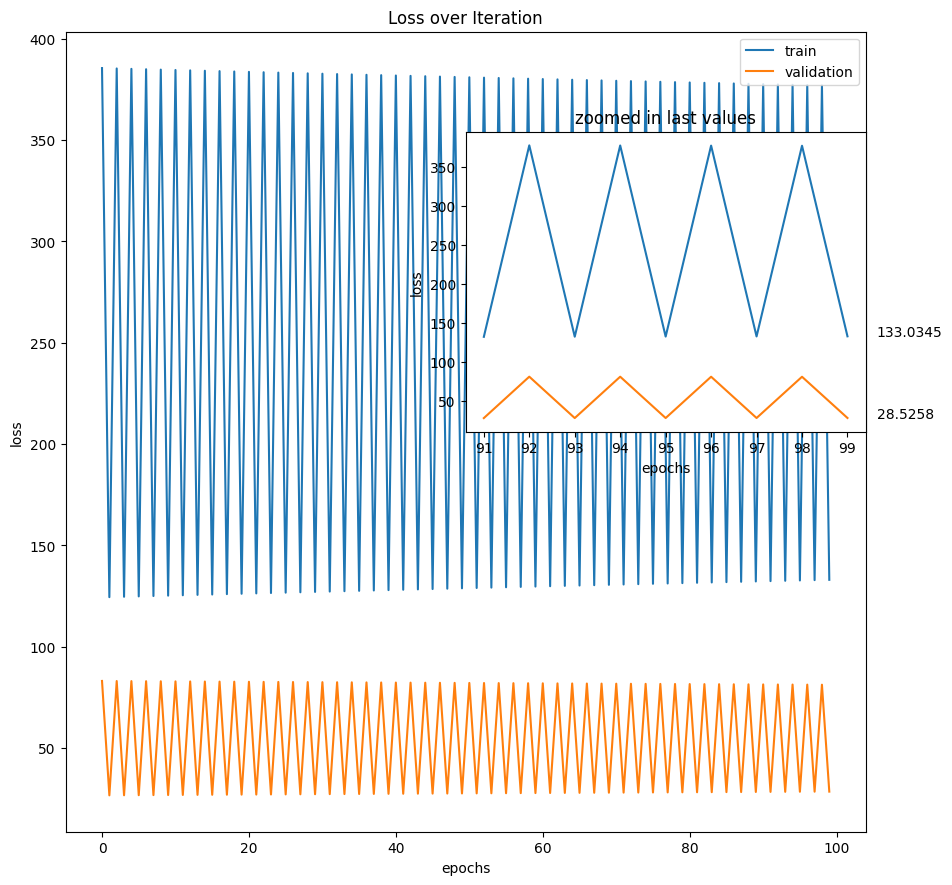

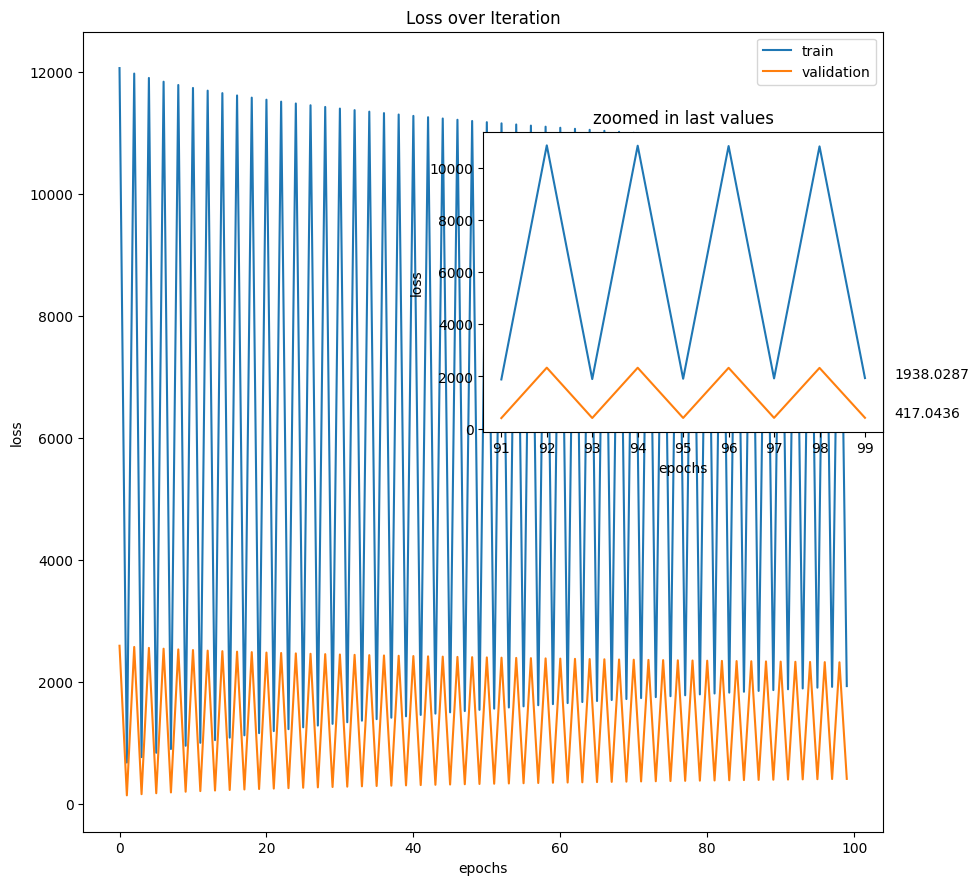

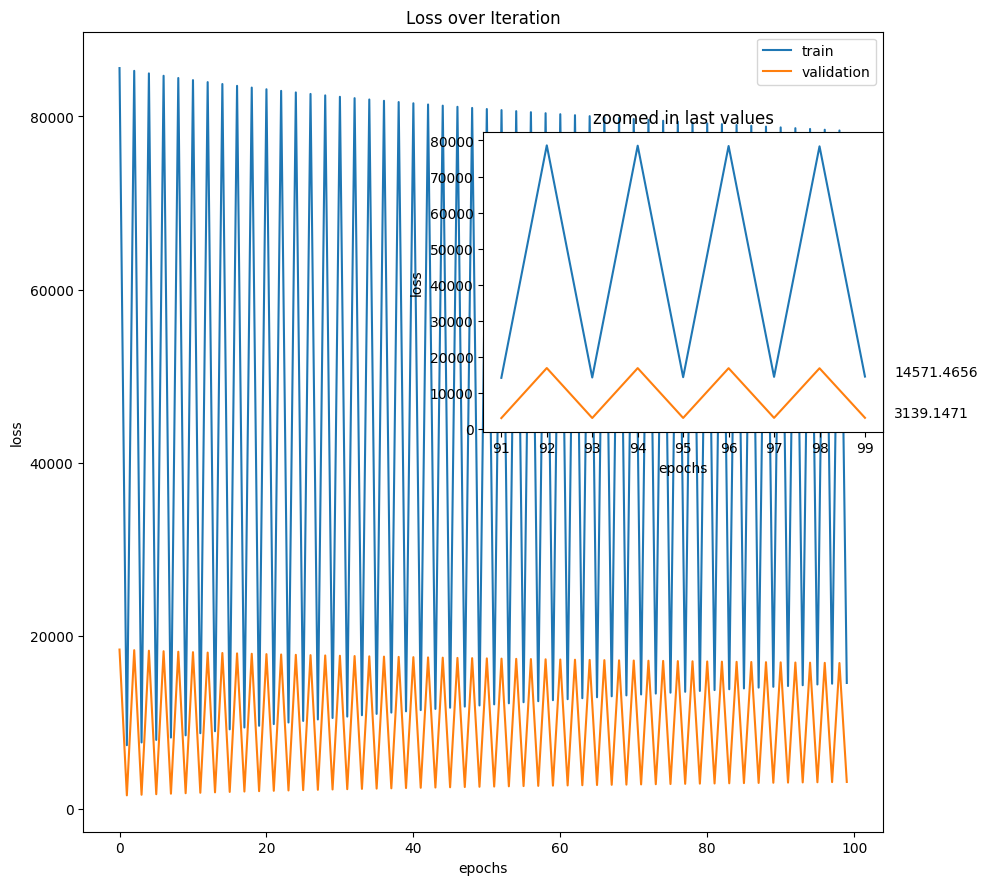

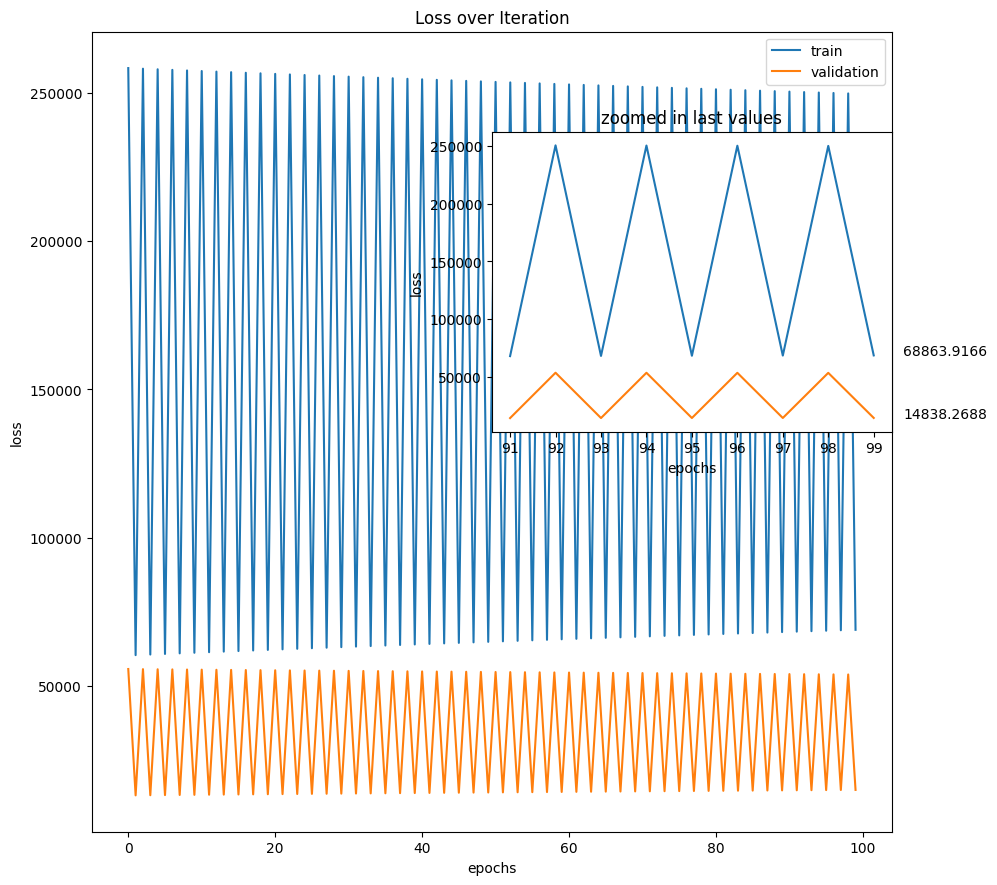

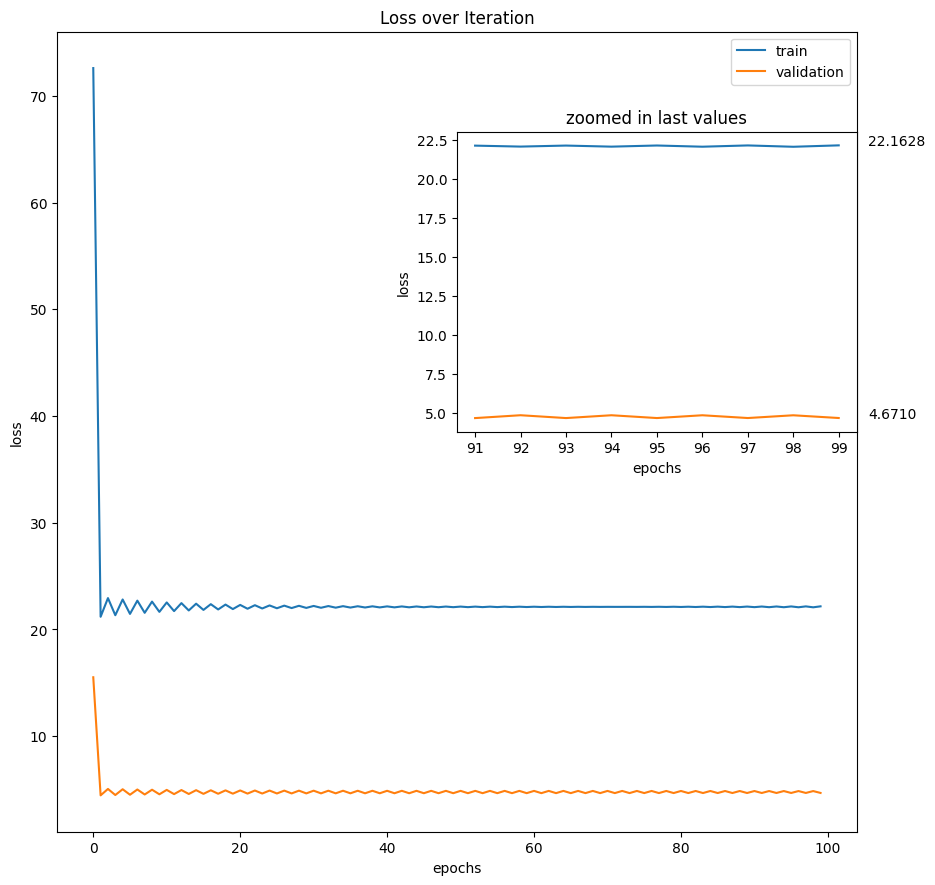

...

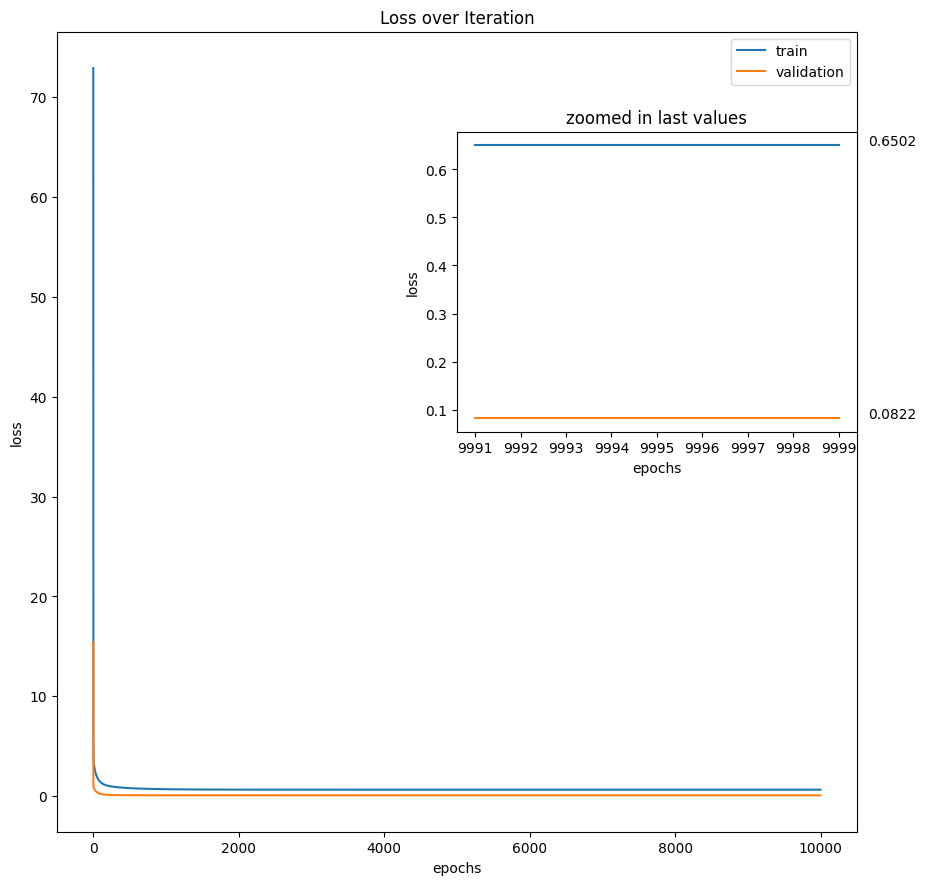

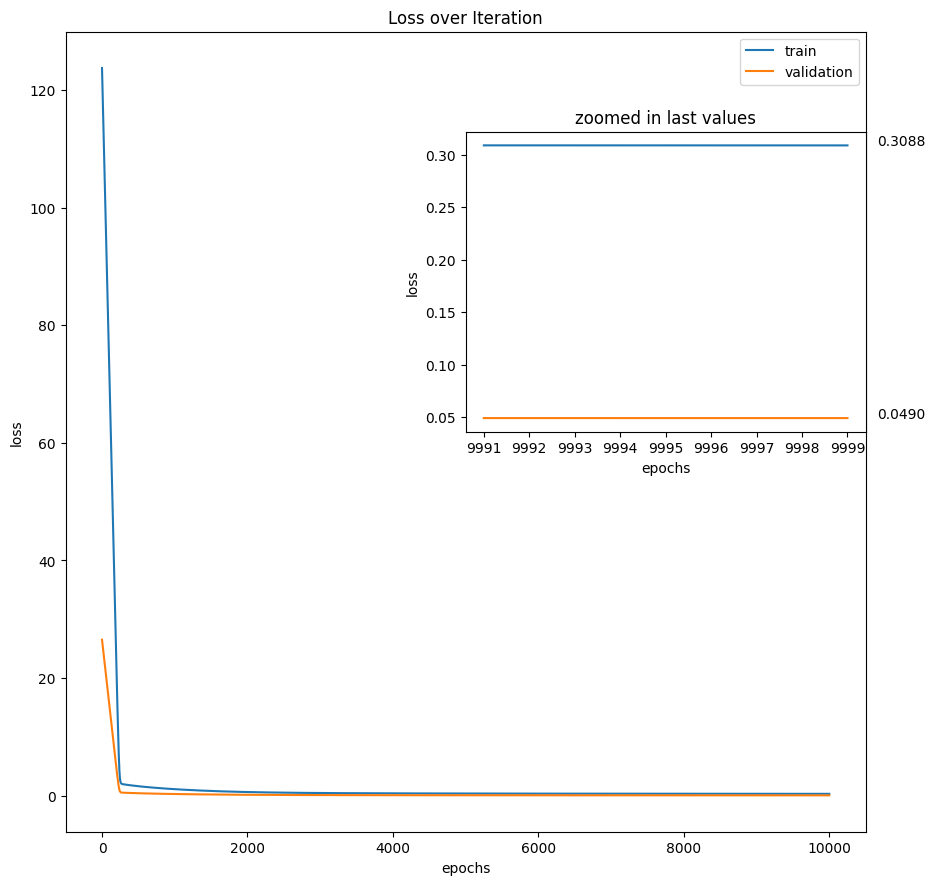

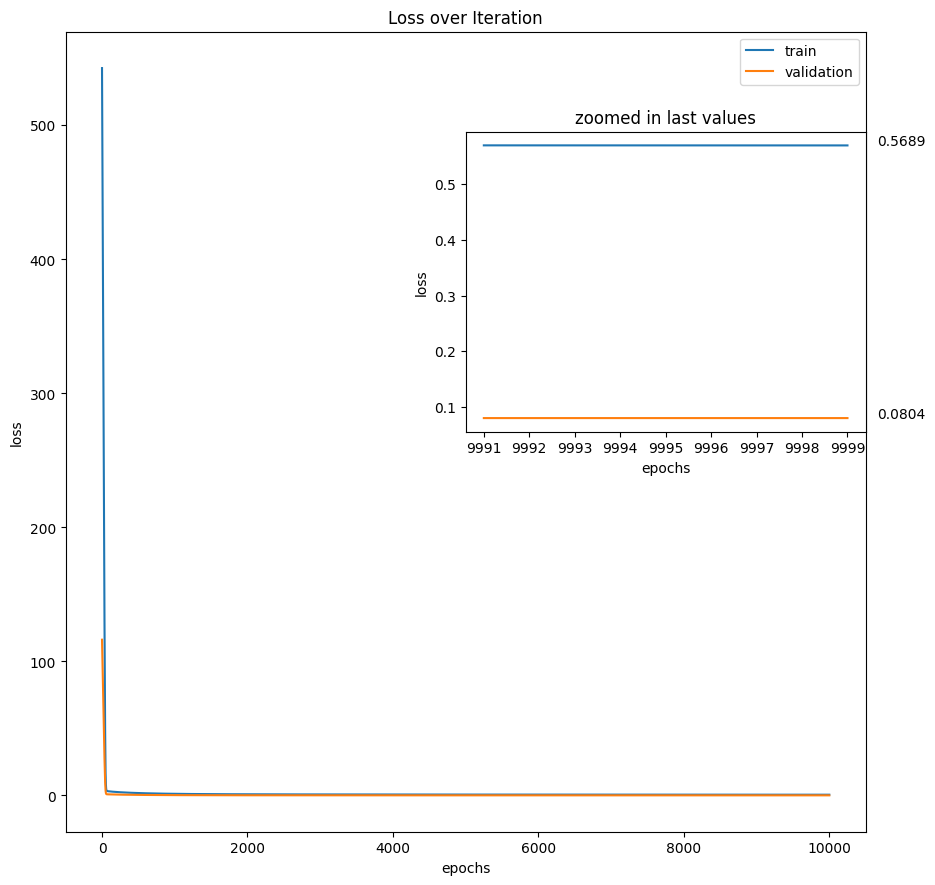

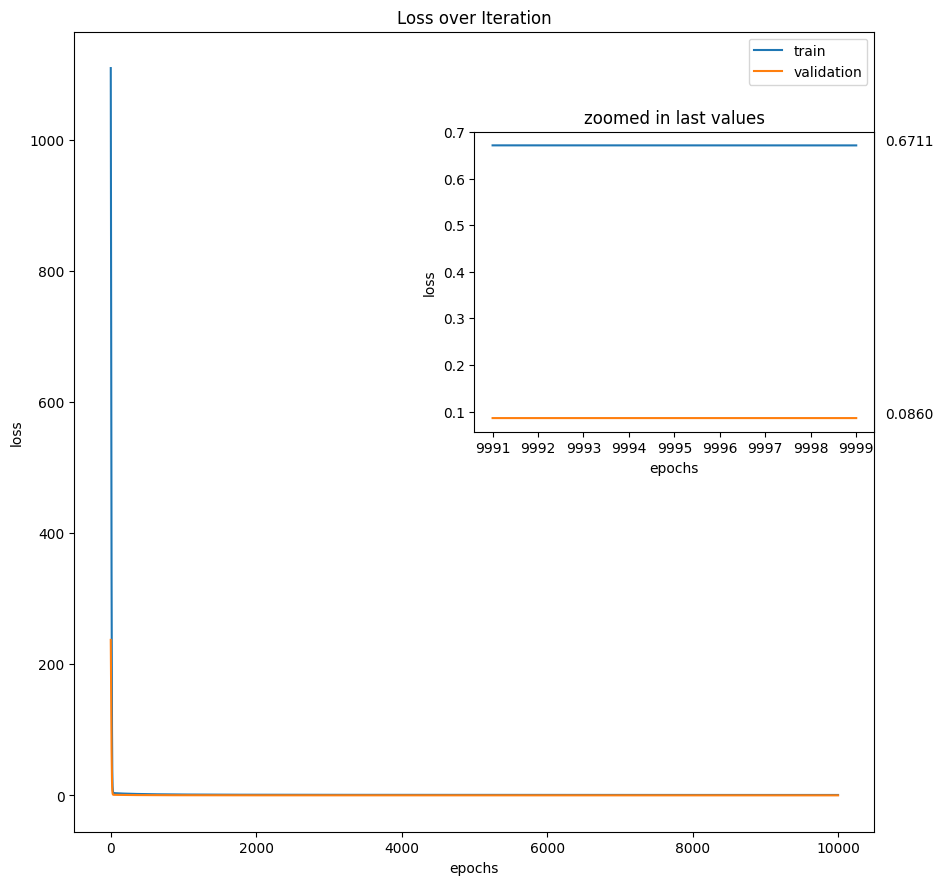

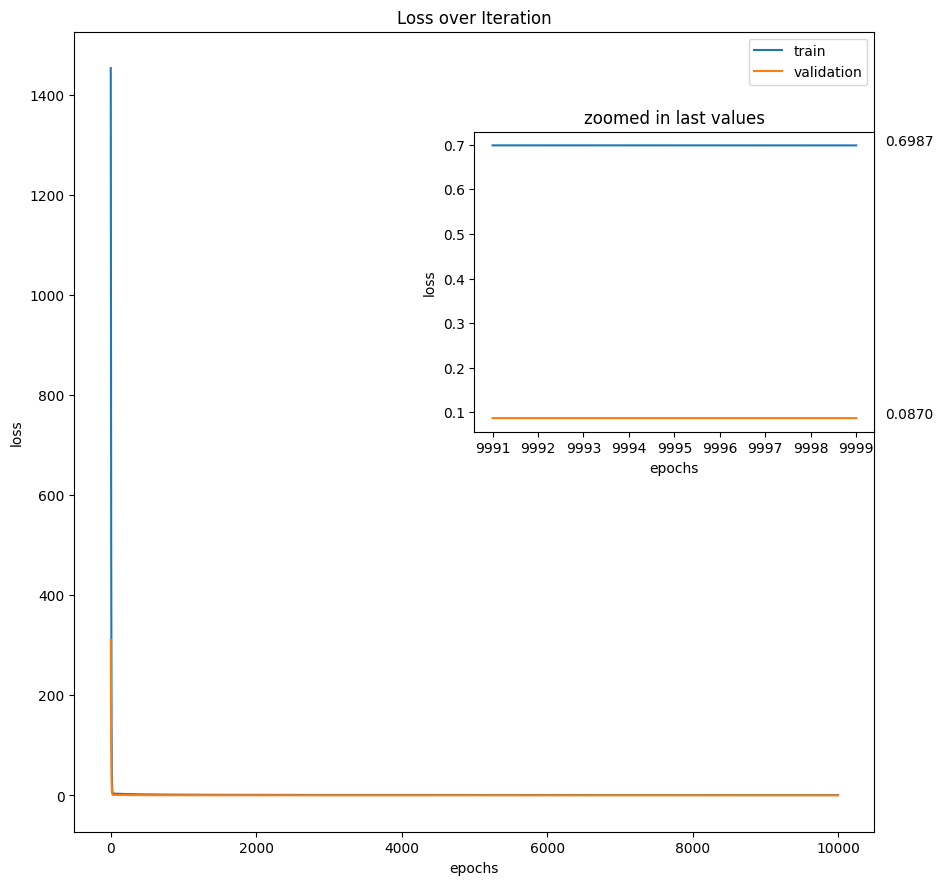

In [76]:

df = pd.DataFrame(columns=["loss","alfa","epochs","d", "loss_train", "loss_val", "loss_test", "r2_train", "r2_val", "r2_test"])
for l in ["pseudohuber"]:
  for e in [100, 1000, 5000, 10000]:
    for a in [0.1, 0.01, 0.001, 0.0001]:
      for d in [0.1, 0.5, 1.35, 2.5]:
        epochs = e # 1500
        alfa = a # 0.0007
        loss = l #"MSE"
        d = d # 1.35
        
        print("---\nloss",loss,"alfa",alfa,"epochs",epochs,"d",d)

        W, loss_train, loss_val, r2_train, r2_val = train_output_print(X_train, Y_train, X_validation, Y_validation, epochs, alfa, loss, d)
        loss_test, r2_test = test_output_print(X_test, W, Y_test, loss, d)

        df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)
df.to_csv("pseudohuber_tests.csv")
print(df.iloc[df['r2_test'].idxmax()])
df


# Prueba hiperparámetros huber

---
loss huber alfa 0.1 epochs 100 d 0.1
[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 0.006765135238045207
Training Completed!
-------------------------------

• with epochs: 100 -> 	last training loss: 0.006765135238045207 
			last validation loss: 0.006584794719892961
			min training loss: 0.006765135238045207
• W array:
 [-0.24831271818019574 -0.16786279451178043 0.38183416674597226
 -0.13768017830945217 -0.087825218058929 0.14096764947460683
 0.17703327775267744 -0.02408412657312042 0.2532166410666829
 0.2864341243455878 0.23982038890990087 -0.30981410887571287
 0.8215704929462209]
• R^2 training: -4.071083152713015
• R^2 validation: -13.583243109985549
• test loss on current model:
 0.005196655434836796
• R^2 test: -81.43634968709114
---
loss huber alfa 0.1 epochs 100 d 0.5
[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 0.0071104994463318765
Training 

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)
C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 0.0073766105814013784
Training Completed!
-------------------------------

• with epochs: 100 -> 	last training loss: 0.007376610581401378 
			last validation loss: 0.0051452532348719975
			min training loss: 0.007376610581401378
• W array:
 [-0.22460275553652567 -0.13916136697723452 0.3289786067640532
 -0.11235238089710371 -0.03603226820701847 0.14495327286008702
 0.08500195074716509 -0.06608458112412088 0.23129579523865082
 0.2242743098440112 0.21172835700716133 -0.2022699438516196
 0.7951942224748432]
• R^2 training: -2.2484353113961615
• R^2 validation: -6.914967858292622
• test loss on current model:
 0.0038942422997218706
• R^2 test: -49.70668988720306
---
loss huber alfa 0.1 epochs 100 d 2.5
[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 0.0072915509957217985
Training Completed!
--------------------------

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)
C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 0.31072180246914935
Training Completed!
-------------------------------

• with epochs: 100 -> 	last training loss: 0.3107218024691493 
			last validation loss: 0.3059432539273671
			min training loss: 0.3107218024691493
• W array:
 [0.5383269304331031 0.1870931375392813 0.6478952384882615
 0.33227584095410445 0.3502067773447605 0.8715610384514876
 0.4941312415775927 0.4886453824395093 0.3806926720390829
 0.7187812320260138 0.5183926117511674 -0.0036653327311262124
 0.8252259279613362]
• R^2 training: -2239.670004475064
• R^2 validation: -7590.969490845877
• test loss on current model:
 0.30635580546112234
• R^2 test: -64273.88516534469
---
loss huber alfa 0.01 epochs 100 d 0.5
[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 0.6543201173891363
Training Completed!
-------------------------------

• with epochs: 10

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)
C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 0.018824762821707298
Training Completed!
-------------------------------

• with epochs: 100 -> 	last training loss: 0.018824762821707298 
			last validation loss: 0.015661396988746704
			min training loss: 0.018824762821707298
• W array:
 [-0.21514127662981208 -0.15651192601651606 0.3927001463104724
 -0.12166674030077251 -0.07492063318099002 0.17095462006849937
 0.18810109726241195 -0.007049315788153465 0.2578417801488668
 0.30323636005609017 0.2512546912474068 -0.3004706283447394
 0.8207049753680482]
• R^2 training: -7.289853938185566
• R^2 validation: -23.09200249693345
• test loss on current model:
 0.01481715196085259
• R^2 test: -191.933225943382
---
loss huber alfa 0.01 epochs 100 d 2.5
[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 0.013190941667683573
Training Completed!
-------------------------------


C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)
C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 0.34668982407528814
Training Completed!
-------------------------------

• with epochs: 100 -> 	last training loss: 0.3466898240752881 
			last validation loss: 0.34148769639279175
			min training loss: 0.3466898240752881
• W array:
 [0.6283268867745665 0.22810419862690945 0.6777408913768206
 0.3856956106975215 0.4008161727413327 0.9548802015658112
 0.5287764619383805 0.5458148057805694 0.3949698517413036
 0.7671035731913554 0.5499842537821628 0.0328831254669863
 0.8255920982298843]
• R^2 training: -2777.2342515908967
• R^2 validation: -9418.186400877768
• test loss on current model:
 0.3416461798426487
• R^2 test: -79645.8740732303
---
loss huber alfa 0.001 epochs 100 d 0.5
[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 1.5535201812618471
Training Completed!
-------------------------------

• with epochs: 100 -

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)
C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 3.1621622344517126
Training Completed!
-------------------------------

• with epochs: 100 -> 	last training loss: 3.1621622344517126 
			last validation loss: 3.0998756194708674
			min training loss: 3.1621622344517126
• W array:
 [0.5033269502350132 0.17114439281029042 0.6362885965919072
 0.3115014875877387 0.33052534728491 0.8391591442566579 0.4806581012308224
 0.4664128304546476 0.37514043589586 0.6999892118493972 0.5061069741557159
 -0.017878620828751753 0.8250835284174]
• R^2 training: -2046.245431315087
• R^2 validation: -6933.642627465685
• test loss on current model:
 3.1067789224988434
• R^2 test: -58741.104137250346
---
loss huber alfa 0.001 epochs 100 d 2.5
[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 3.3409851271533073
Training Completed!
-------------------------------

• with epochs: 100 -> 	las

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)
C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 0.35028662642204796
Training Completed!
-------------------------------

• with epochs: 100 -> 	last training loss: 0.3502866264220479 
			last validation loss: 0.34504214082348755
			min training loss: 0.3502866264220479
• W array:
 [0.6373268828961947 0.2322053049512639 0.6807254568201101
 0.39103758793672433 0.4058771125370061 0.9632121183213499
 0.5322409841311371 0.5515317483805161 0.3963975697820148
 0.7719358075478712 0.5531434181532904 0.03653797149368031
 0.8256287152576138]
• R^2 training: -2834.1734687411313
• R^2 validation: -9611.754360224142
• test loss on current model:
 0.3451752174634483
• R^2 test: -81273.74410909663
---
loss huber alfa 0.0001 epochs 100 d 0.5
[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 1.6434402379876958
Training Completed!
-------------------------------

• with epochs: 10

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)
C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 3.8176794128070224
Training Completed!
-------------------------------

• with epochs: 100 -> 	last training loss: 3.8176794128070224 
			last validation loss: 3.7476730681514665
			min training loss: 3.8176794128070224
• W array:
 [0.6248268883043734 0.2265093239547434 0.6765802270445948
 0.38361817511620866 0.39884802949877596 0.9516400117360709
 0.5274291477592492 0.5435915503368018 0.39441462806192384
 0.7652243709522201 0.5487556898674906 0.03146179646573546
 0.8255778582746954]
• R^2 training: -2755.247504594853
• R^2 validation: -9343.442547147384
• test loss on current model:
 3.749945980475593
• R^2 test: -79017.26565029542
---
loss huber alfa 0.0001 epochs 100 d 2.5
[================================================= ] 99.0%  TRAINING IN PROGRESS | last computed training loss: 5.5189798685596165
Training Completed!
-------------------------------

• with epochs: 100 

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)
C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 0.0012975828815469854
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 0.0012975828815469854 
			last validation loss: 0.0010809339379823683
			min training loss: 0.0012975828815469854
• W array:
 [-0.1894160895072035 -0.04048383709103273 0.09405404548171346
 0.004925716009483221 -0.004055776494475421 0.1272391344206072
 -0.05290847381713963 -0.0177995310272889 0.13734105523730106
 0.08668153716755549 0.09519046511068852 -0.013206662664498195
 0.7851212852219684]
• R^2 training: -0.6141665845309046
• R^2 validation: -0.9312696313962818
• test loss on current model:
 0.0004956884104832152
• R^2 test: -5.5159524366437065
---
loss huber alfa 0.1 epochs 1000 d 0.5
[======                                            ] 13.8%  TRAINING IN PROGRESS | last computed training loss: 0.0061865019240402076

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 0.0027622174456713927
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 0.00276221744567139 
			last validation loss: 0.001023972576196002
			min training loss: 0.00276221744567139
• W array:
 [-0.17017454864352008 -0.027960567518772992 0.07741790841240125
 0.03291626639520011 0.006142208241417456 0.12162972392209047
 -0.036158087659606465 -0.024823962236767194 0.10517893292321519
 0.056346326646427615 0.048225991435258235 -0.010226573897264342
 0.668846964266867]
• R^2 training: -0.3993772471599484
• R^2 validation: -0.5751819508969371
• test loss on current model:
 0.0003532754411215336
• R^2 test: -3.599977828548024
---
loss huber alfa 0.1 epochs 1000 d 1.35
[=======                                           ] 14.8%  TRAINING IN PROGRESS | last computed training loss: 0.0063261999818145475

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 0.0030001529602342717
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 0.0030001529602342717 
			last validation loss: 0.0009806020559456812
			min training loss: 0.0030001529602342717
• W array:
 [-0.1685595416774306 -0.023703009053040593 0.0800816076108491
 0.0350774421621937 0.011051771025533704 0.1189603534260967
 -0.03441291925267673 -0.021494411021427684 0.0992939388006846
 0.053076044206959896 0.032772809094337295 -0.008067194723131802
 0.5948046871853712]
• R^2 training: -0.3211762649077319
• R^2 validation: -0.5084648704912227
• test loss on current model:
 0.00035281393402118786
• R^2 test: -3.5939685729298905
---
loss huber alfa 0.1 epochs 1000 d 2.5
[======                                            ] 12.9%  TRAINING IN PROGRESS | last computed training loss: 0.0066222234935105775

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 0.0029970507989605243
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 0.0029970507989605243 
			last validation loss: 0.0009786663591593873
			min training loss: 0.0029970507989605243
• W array:
 [-0.16807188986923996 -0.02353328651119135 0.07972298500548394
 0.03504145431172597 0.011071998971173587 0.11876850615841557
 -0.034281526463540775 -0.021400830792564857 0.09883826959922161
 0.05275343324633684 0.032449177212322745 -0.008077169974975686
 0.5941059857044295]
• R^2 training: -0.31981016727900524
• R^2 validation: -0.5054871787921873
• test loss on current model:
 0.0003509468711004622
• R^2 test: -3.5696576612724664
---
loss huber alfa 0.01 epochs 1000 d 0.1
[======                                            ] 13.0%  TRAINING IN PROGRESS | last computed training loss: 0.29833281817799983

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 0.0067654177571824426
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 0.006765417757182442 
			last validation loss: 0.0065769947329932426
			min training loss: 0.006765417757182442
• W array:
 [-0.24762902143203835 -0.16753152868501361 0.3819821609413602
 -0.13734391191696962 -0.08743459715026487 0.1415518619692906
 0.1770391894873578 -0.02395078044865959 0.2532737229335459
 0.28659469573839563 0.239994310845202 -0.3092641282332328
 0.821569598275941]
• R^2 training: -4.066705544016747
• R^2 validation: -13.536767484989946
• test loss on current model:
 0.005215881342762416
• R^2 test: -81.742564722638
---
loss huber alfa 0.01 epochs 1000 d 0.5
[======                                            ] 12.9%  TRAINING IN PROGRESS | last computed training loss: 0.35532043288154475

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\2247464532.py:9: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure()
C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 0.0071040832326739125
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 0.007104083232673912 
			last validation loss: 0.005519041287912662
			min training loss: 0.007104083232673912
• W array:
 [-0.22785801492394403 -0.14092587930462194 0.33515945213680554
 -0.11668821931232659 -0.0442358643847478 0.14445543835801541
 0.09565127334571252 -0.06334832102050576 0.2348634669554872
 0.23100769691215875 0.21965331485483336 -0.21194523662270676
 0.8092195456738538]
• R^2 training: -2.417986189958428
• R^2 validation: -7.4899678224497315
• test loss on current model:
 0.0041099320402595355
• R^2 test: -52.515172755892486
---
loss huber alfa 0.01 epochs 1000 d 1.35
[======                                            ] 12.4%  TRAINING IN PROGRESS | last computed training loss: 0.012282615348773554

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 0.0073677232780354875
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 0.007367723278035487 
			last validation loss: 0.0051347293245177185
			min training loss: 0.007367723278035487
• W array:
 [-0.22405189934191705 -0.13933056635329294 0.3286325344375988
 -0.11233217933427332 -0.036393069772992975 0.14527203082244436
 0.08449042710606255 -0.06635687284378171 0.23113311284893864
 0.22410822185144205 0.21164234471702528 -0.20207008388121442
 0.7951282513539839]
• R^2 training: -2.244521612854219
• R^2 validation: -6.898778876255135
• test loss on current model:
 0.0038925471807972436
• R^2 test: -49.68461784776186
---
loss huber alfa 0.01 epochs 1000 d 2.5
[======                                            ] 13.5%  TRAINING IN PROGRESS | last computed training loss: 0.011049866812045562

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 0.0072805855193147355
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 0.007280585519314735 
			last validation loss: 0.005036918562781282
			min training loss: 0.007280585519314735
• W array:
 [-0.22094713054893997 -0.13977758271486201 0.3265164074937644
 -0.11220863627154558 -0.03675259772096064 0.1468427213714843
 0.08066743789566008 -0.06881275858960349 0.2300791964871319
 0.22219734010488634 0.21100509562459707 -0.19932804650000405
 0.7939899734795731]
• R^2 training: -2.2061487898265195
• R^2 validation: -6.748316109895637
• test loss on current model:
 0.003867024030288321
• R^2 test: -49.35228247204762
---
loss huber alfa 0.001 epochs 1000 d 0.1
[======                                            ] 12.2%  TRAINING IN PROGRESS | last computed training loss: 0.34577064125827445

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 0.31072180248910974
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 0.31072180248910974 
			last validation loss: 0.3059432539471138
			min training loss: 0.31072180248910974
• W array:
 [0.5383269304853807 0.18709313756240595 0.6478952385048193
 0.33227584098250695 0.35020677737221784 0.8715610384991116
 0.4941312415943789 0.4886453824680014 0.38069267204663854
 0.7187812320517366 0.5183926117691798 -0.0036653327089207015
 0.8252259279614298]
• R^2 training: -2239.6700047570334
• R^2 validation: -7590.969491805075
• test loss on current model:
 0.3063558054807074
• R^2 test: -64273.88517341038
---
loss huber alfa 0.001 epochs 1000 d 0.5
[======                                            ] 12.4%  TRAINING IN PROGRESS | last computed training loss: 1.5285423884892548

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 0.6543201254652268
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 0.6543201254652268 
			last validation loss: 0.6398402474487213
			min training loss: 0.6543201254652268
• W array:
 [0.13832737763915193 0.004821867474692147 0.5152479719920614
 0.09485477964634934 0.12527626428321798 0.5012538771458154
 0.3401525638682317 0.2345591924585804 0.3172385761913019
 0.5040153943521116 0.3779854002135751 -0.1661028149211952
 0.8235985049309544]
• R^2 training: -550.63848849482
• R^2 validation: -1855.9410878915317
• test loss on current model:
 0.6475489585174288
• R^2 test: -15899.551839174143
---
loss huber alfa 0.001 epochs 1000 d 1.35
[======                                            ] 13.0%  TRAINING IN PROGRESS | last computed training loss: 2.9363730097040635

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 0.019490641532177316
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 0.019490641532177316 
			last validation loss: 0.016268369131839523
			min training loss: 0.019490641532177316
• W array:
 [-0.2137073915587736 -0.15588042011157752 0.3931283777753576
 -0.1208879154838796 -0.07416331892723281 0.17225476153672123
 0.18851317934670184 -0.006296710731247964 0.25803993270714604
 0.30391386852659397 0.25173623444250687 -0.29983175082317237
 0.8207031877364582]
• R^2 training: -7.583086703061554
• R^2 validation: -24.025710671080912
• test loss on current model:
 0.015525868861464018
• R^2 test: -201.16138519266391
---
loss huber alfa 0.001 epochs 1000 d 2.5
[======                                            ] 13.4%  TRAINING IN PROGRESS | last computed training loss: 2.5756953462717874

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 0.013470193953053719
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 0.01347019395305371 
			last validation loss: 0.010824558323257124
			min training loss: 0.01347019395305371
• W array:
 [-0.22228138078181203 -0.1615207280812182 0.3867236876160574
 -0.1315487302514226 -0.08196227912631388 0.16221329965891054
 0.17466257480474268 -0.02354889471043032 0.2544532209876799
 0.2922716045179965 0.24718470007865692 -0.29925735869884695
 0.8194027841781295]
• R^2 training: -4.931864398370062
• R^2 validation: -15.651470257697724
• test loss on current model:
 0.009223895951202127
• R^2 test: -119.10378285471312
---
loss huber alfa 0.0001 epochs 1000 d 0.1
[======                                            ] 13.2%  TRAINING IN PROGRESS | last computed training loss: 0.35015474366880326

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 0.34668982407545706
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 0.34668982407545706 
			last validation loss: 0.3414876963929592
			min training loss: 0.34668982407545706
• W array:
 [0.6283268867750099 0.22810419862710532 0.6777408913769606
 0.38569561069776176 0.4008161727415656 0.9548802015662156
 0.5287764619385233 0.5458148057808109 0.39496985174136756
 0.7671035731915735 0.549984253782315 0.03288312546717398
 0.8255920982298782]
• R^2 training: -2777.234251593558
• R^2 validation: -9418.186400886827
• test loss on current model:
 0.34164617984281487
• R^2 test: -79645.87407330648
---
loss huber alfa 0.0001 epochs 1000 d 0.5
[=====                                             ] 11.7%  TRAINING IN PROGRESS | last computed training loss: 1.6416418368142622

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 1.5535201812845577
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 1.55352018128455 
			last validation loss: 1.5284508298748576
			min training loss: 1.55352018128455
• W array:
 [0.5883269050315176 0.20987705985843805 0.6644761563964823
 0.361953490188489 0.3783231075182821 0.9178494613591603 0.513378585854265
 0.5204061725595549 0.3886244383745718 0.745626976553611
 0.5359435235954527 0.016639365780665258 0.8254293558862662]
• R^2 training: -2531.1724932548236
• R^2 validation: -8581.743715288781
• test loss on current model:
 1.5298078428838768
• R^2 test: -72610.35230436108
---
loss huber alfa 0.0001 epochs 1000 d 1.35
[======                                            ] 13.3%  TRAINING IN PROGRESS | last computed training loss: 3.7929154288936145

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 3.1621622349786526
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 3.162162234978652 
			last validation loss: 3.0998756199921687
			min training loss: 3.162162234978652
• W array:
 [0.5033269503372595 0.17114439285553137 0.6362885966242748
 0.3115014876432851 0.330525347338618 0.8391591443497921
 0.48065810126360475 0.46641283051031873 0.3751404359106271
 0.6999892118996667 0.5061069741909289 -0.01787862078526562
 0.8250835284175803]
• R^2 training: -2046.2454318420682
• R^2 validation: -6933.642629258147
• test loss on current model:
 3.1067789230158693
• R^2 test: -58741.104152327374
---
loss huber alfa 0.0001 epochs 1000 d 2.5
[======                                            ] 12.9%  TRAINING IN PROGRESS | last computed training loss: 5.4444506006645875

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.9%  TRAINING IN PROGRESS | last computed training loss: 3.3413790457784183
Training Completed!
-------------------------------

• with epochs: 1000 -> 	last training loss: 3.341379045778418 
			last validation loss: 3.2437796434283315
			min training loss: 3.341379045778418
• W array:
 [0.3930810041780078 0.12069863142313536 0.5995275423677151
 0.24454532878596327 0.267646485056041 0.7366760289873242
 0.43679235115798437 0.3939471884483597 0.35729208867885015
 0.6396593295693028 0.4673295692884746 -0.06219240066188597
 0.824615644227083]
• R^2 training: -1488.8023228409652
• R^2 validation: -5040.108443847108
• test loss on current model:
 3.2588116526586295
• R^2 test: -42789.285063301664
---
loss huber alfa 0.1 epochs 5000 d 0.1
[=                                                 ] 2.74%  TRAINING IN PROGRESS | last computed training loss: 0.0058516554512492874

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 0.0008922417887917458
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.0008922417887917458 
			last validation loss: 0.0006084653741736005
			min training loss: 0.0008922417887917458
• W array:
 [-0.05525918331131167 0.0017533708722996986 0.0024082735543574712
 0.020361477856797722 0.004460546908106404 0.06547479671111421
 0.003583985904594413 -0.013587715838193536 -0.022210856611416526
 -0.0011967517496625725 -0.0037416527293145318 -0.004827610177945599
 0.627337605830824]
• R^2 training: -0.2587847167045798
• R^2 validation: -0.16950944712600524
• test loss on current model:
 9.278937110657068e-05
• R^2 test: -0.2082047041257591
---
loss huber alfa 0.1 epochs 5000 d 0.5
[=                                                 ] 2.92%  TRAINING IN PROGRESS | last computed training loss: 0.0060334923377861245

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 0.0019438076580807495
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.0019438076580807495 
			last validation loss: 0.0006715751358462583
			min training loss: 0.0019438076580807495
• W array:
 [-0.04340446654254268 0.00990165192971002 0.004335211247418492
 0.01971392572990381 0.007853100030472987 0.049075587617415206
 0.020749516176974906 -0.011624974799186652 -0.02957500822770542
 -0.003412585486403311 -0.02443960212938613 0.0016386920523983736
 0.21021425251905268]
• R^2 training: -0.01064517249583341
• R^2 validation: -0.03308726937399742
• test loss on current model:
 0.00011371077504278393
• R^2 test: -0.4806210202533514
---
loss huber alfa 0.1 epochs 5000 d 1.35
[=                                                 ] 2.9%  TRAINING IN PROGRESS | last computed training loss: 0.00637931329268046435

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 0.0022659377819157327
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.0022659377819157327 
			last validation loss: 0.000679149677224343
			min training loss: 0.0022659377819157327
• W array:
 [-0.047527360701824804 0.015135165099753104 0.007999862743889714
 0.021704456584860178 0.009679487887067257 0.04368776399081808
 0.022886910986088048 -0.010873591403585474 -0.0351771805796414
 0.006139275709652517 -0.031193163198165976 0.006673260401067575
 0.17416998596452857]
• R^2 training: 0.0021498053915991466
• R^2 validation: -0.0447392228954524
• test loss on current model:
 0.00014060500813948269
• R^2 test: -0.8308091781617213
---
loss huber alfa 0.1 epochs 5000 d 2.5


C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 0.0022658012127064433
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.002265801212706443 
			last validation loss: 0.0006791276975368323
			min training loss: 0.002265801212706443
• W array:
 [-0.04740430023467863 0.015141517334003122 0.007990121180533341
 0.021683787467554904 0.009674086237187214 0.04356023308717458
 0.022903560125545428 -0.010857454083283528 -0.03516643495860009
 0.006136367020191668 -0.031214770795078384 0.00667946800590536
 0.17397786872536192]
• R^2 training: 0.002209946324486012
• R^2 validation: -0.04470541143618334
• test loss on current model:
 0.00014060645999508818
• R^2 test: -0.8308280826844192
---
loss huber alfa 0.01 epochs 5000 d 0.1
[=                                                 ] 2.88%  TRAINING IN PROGRESS | last computed training loss: 0.29273779319884086

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 0.0023033459504567975
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.0023033459504567975 
			last validation loss: 0.0021824308423647005
			min training loss: 0.0023033459504567975
• W array:
 [-0.21482602596881106 -0.09332265774169256 0.21073968722546452
 -0.06468799555524328 -0.011028764701607827 0.13829172569225362
 -0.009875793664310198 -0.04566098818900318 0.19899281263894011
 0.1599502700832731 0.17428227180678768 -0.08879250799722005
 0.8053893985822042]
• R^2 training: -1.1588324380099024
• R^2 validation: -2.902212545468935
• test loss on current model:
 0.001649370591721154
• R^2 test: -21.2708865127334
---
loss huber alfa 0.01 epochs 5000 d 0.5
[=                                                 ] 2.68%  TRAINING IN PROGRESS | last computed training loss: 0.30618610722562206

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 0.0034153789954213185
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.0034153789954213185 
			last validation loss: 0.001650141558414409
			min training loss: 0.0034153789954213185
• W array:
 [-0.20100213861691418 -0.07333555606648558 0.16465248386813178
 -0.00364862290188734 -0.004497366380954258 0.13174109723686164
 -0.026909329023533015 -0.04302577795459625 0.16558909197864702
 0.1133185557675393 0.11108844719519452 -0.04286410473788886
 0.746606893117106]
• R^2 training: -0.72511007281183
• R^2 validation: -1.5384207152260538
• test loss on current model:
 0.0009738438613283457
• R^2 test: -11.680361126594399
---
loss huber alfa 0.01 epochs 5000 d 1.35
[=                                                 ] 2.58%  TRAINING IN PROGRESS | last computed training loss: 0.011932986970511904

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 0.0037271269480515907
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.0037271269480515907 
			last validation loss: 0.0015618705042365736
			min training loss: 0.0037271269480515907
• W array:
 [-0.19938663981018825 -0.0697696853155148 0.16460016394630753
 0.0007987286561092613 0.0021860125872875755 0.1301400530752166
 -0.028974839105256472 -0.0398575601947643 0.1602818349701885
 0.10882940279075648 0.09543442804474259 -0.041506124693362775
 0.6968651922423105]
• R^2 training: -0.6413135347869863
• R^2 validation: -1.4026329269982605
• test loss on current model:
 0.0009171665396045192
• R^2 test: -10.942369200285006
---
loss huber alfa 0.01 epochs 5000 d 2.5
[=                                                 ] 2.26%  TRAINING IN PROGRESS | last computed training loss: 0.011730261922797777

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 0.0037178323157144584
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.0037178323157144584 
			last validation loss: 0.0015538435588441305
			min training loss: 0.0037178323157144584
• W array:
 [-0.19856438813774407 -0.06953142301884235 0.16368512452730138
 0.0010449734245801614 0.002202475033580485 0.13007591178736908
 -0.029274541289006962 -0.03972556699087857 0.1595553566486794
 0.10818193551662791 0.09480677898859119 -0.04148809932947486
 0.6959570003772988]
• R^2 training: -0.6372204609345431
• R^2 validation: -1.3902850382003171
• test loss on current model:
 0.0009096188033600449
• R^2 test: -10.844090590059253
---
loss huber alfa 0.001 epochs 5000 d 0.1
[=                                                 ] 2.48%  TRAINING IN PROGRESS | last computed training loss: 0.34569071231776106

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 0.15086402523734474
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.15086402523734474 
			last validation loss: 0.1479680496325289
			min training loss: 0.15086402523734474
• W array:
 [0.13832737801850614 0.004821867643966648 0.5152479721110562
 0.09485477985273023 0.125276264482877 0.5012538774906402
 0.3401525639855505 0.23455919266052133 0.31723857624507124
 0.5040153945351148 0.3779854003419785 -0.1661028147543718
 0.8235985049314819]
• R^2 training: -550.638489502054
• R^2 validation: -1855.9410913088484
• test loss on current model:
 0.14950979184504418
• R^2 test: -15899.551868103203
---
loss huber alfa 0.001 epochs 5000 d 0.5


C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 0.009030281832682254
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.00903028183268225 
			last validation loss: 0.007582096937864167
			min training loss: 0.00903028183268225
• W array:
 [-0.23863919468650538 -0.1562529315613473 0.36576978507260915
 -0.13245813880104962 -0.06831222029722281 0.14325952712817908
 0.14257024713325542 -0.0446506296359314 0.24622602939368562
 0.26364551104937006 0.23384289581888087 -0.2701248013392292
 0.8169806911408818]
• R^2 training: -3.2843430135143645
• R^2 validation: -10.663576275492447
• test loss on current model:
 0.005294205315236807
• R^2 test: -67.93552235773
---
loss huber alfa 0.001 epochs 5000 d 1.35
[=                                                 ] 2.88%  TRAINING IN PROGRESS | last computed training loss: 2.8344036878385483

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 0.009091110570905434
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.009091110570905434 
			last validation loss: 0.006908713360426167
			min training loss: 0.009091110570905434
• W array:
 [-0.23292433364656487 -0.15323794214384054 0.3588827675727099
 -0.13022819513883124 -0.05973477442729646 0.14528540142066607
 0.12758591618068485 -0.05281041584788422 0.24273155497729812
 0.25473059177047563 0.22921566404691765 -0.25551355388354724
 0.8090169730905353]
• R^2 training: -3.0034490464759998
• R^2 validation: -9.627707071698744
• test loss on current model:
 0.004960168410206382
• R^2 test: -63.586048326422656
---
loss huber alfa 0.001 epochs 5000 d 2.5
[=                                                 ] 2.86%  TRAINING IN PROGRESS | last computed training loss: 2.3988008735909167

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 0.008916601756524357
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.008916601756524357 
			last validation loss: 0.0067094356417844985
			min training loss: 0.008916601756524357
• W array:
 [-0.22860032352188014 -0.15326835449409082 0.3568648820150273
 -0.13088798250354058 -0.0598547210434126 0.14766661290235908
 0.12188860619007534 -0.05748305769605 0.24158409544569168
 0.25203045117578043 0.2290213048381716 -0.25114525048330577
 0.8078268338281598]
• R^2 training: -2.9266006635323913
• R^2 validation: -9.321157196323762
• test loss on current model:
 0.004906290099750796
• R^2 test: -62.884502153984215
---
loss huber alfa 0.0001 epochs 5000 d 0.1


C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 0.33070403625731365
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.33070403625731365 
			last validation loss: 0.3256901659753712
			min training loss: 0.33070403625731365
• W array:
 [0.5883269050325739 0.20987705985890526 0.6644761563968173
 0.3619534901890642 0.37832310751883613 0.9178494613601248
 0.5133785858546053 0.5204061725601336 0.38862443837472543
 0.7456269765541329 0.5359435235958163 0.016639365781113583
 0.8254293558862613]
• R^2 training: -2531.172493260891
• R^2 validation: -8581.743715309423
• test loss on current model:
 0.3259615685771718
• R^2 test: -72610.35230453456
---
loss huber alfa 0.0001 epochs 5000 d 0.5
[=                                                 ] 2.34%  TRAINING IN PROGRESS | last computed training loss: 1.6416418368142622

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 1.1538755523251265
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 1.153875552325126 
			last validation loss: 1.1335126352194074
			min training loss: 1.153875552325126
• W array:
 [0.388327031169272 0.11874138144803072 0.5981524925166757
 0.24324290657445657 0.26585779971499496 0.7326957920663989
 0.4363892165704815 0.39336302538968404 0.3568973765658385
 0.6382440104693963 0.46573988464963806 -0.06457941778319816
 0.8246156442280328]
• R^2 training: -1472.3272695285577
• R^2 validation: -4983.841047043601
• test loss on current model:
 1.1376926264851763
• R^2 test: -42317.3843412864
---
loss huber alfa 0.0001 epochs 5000 d 1.35
[=                                                 ] 2.7%  TRAINING IN PROGRESS | last computed training loss: 3.79145872396100366

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 0.47353279873567716
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.47353279873567716 
			last validation loss: 0.4531323460869207
			min training loss: 0.47353279873567716
• W array:
 [-0.011363641817703163 -0.06378885566293378 0.4646254841037978
 0.003190158813048053 0.03934692894852511 0.3617502318123637
 0.27839219909181473 0.13383169090695207 0.2925739290079627
 0.42065564174165465 0.3248723373592753 -0.22503432576274604
 0.8228886918130245]
• R^2 training: -207.86602656054066
• R^2 validation: -696.05744322624
• test loss on current model:
 0.4637362438162842
• R^2 test: -6037.28115839842
---
loss huber alfa 0.0001 epochs 5000 d 2.5
[=                                                 ] 2.72%  TRAINING IN PROGRESS | last computed training loss: 5.4270703343787025

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 0.14442504908021275
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.1444250490802127 
			last validation loss: 0.13521561816133418
			min training loss: 0.1444250490802127
• W array:
 [-0.1143971629754932 -0.11316937730108935 0.4264855255802819
 -0.06551700743594037 -0.023490153588126565 0.2638206363854587
 0.22587184926899448 0.05328103111945817 0.27360199968924453
 0.35691224398356153 0.28709999896335936 -0.2626384610702191
 0.8213767499914623]
• R^2 training: -62.60040618996017
• R^2 validation: -207.00283733998828
• test loss on current model:
 0.14067042385753903
• R^2 test: -1830.660952210158
---
loss huber alfa 0.1 epochs 10000 d 0.1
[                                                  ] 1.31%  TRAINING IN PROGRESS | last computed training loss: 0.0059801215275601154

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 0.0008103878145112994
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.0008103878145112994 
			last validation loss: 0.0005539227535873592
			min training loss: 0.0008103878145112994
• W array:
 [-0.012643979920825502 0.0035207835036225694 -0.00158593188887524
 0.01755099365667603 0.003744388573486923 0.023552617387447586
 0.011554576188584832 -0.01157870101044498 -0.021349507918673048
 -0.005577301480131913 -0.013345510820549729 -0.0041458467301592325
 0.43600199519994715]
• R^2 training: -0.11858695024902355
• R^2 validation: -0.08576677940496458
• test loss on current model:
 8.361753254344388e-05
• R^2 test: -0.08877875732497165
---
loss huber alfa 0.1 epochs 10000 d 0.5
[                                                  ] 1.09%  TRAINING IN PROGRESS | last computed training loss: 0.0068399595992067395

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 0.0018712636022838313
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.0018712636022838313 
			last validation loss: 0.0006506295543284097
			min training loss: 0.0018712636022838313
• W array:
 [-0.014273458504052034 0.01315465875586606 0.000689001716505006
 0.017605222988108175 0.004180860329158775 0.009008476233099052
 0.025875802888922425 -0.011697646260451274 -0.026159224753257295
 0.008308764861754697 -0.021614707069972587 0.006666374734562552
 0.04155812932763904]
• R^2 training: 0.022439801568542306
• R^2 validation: -0.0008665803390199844
• test loss on current model:
 0.00011222268196096387
• R^2 test: -0.46124465160044825
---
loss huber alfa 0.1 epochs 10000 d 1.35
[                                                  ] 1.32%  TRAINING IN PROGRESS | last computed training loss: 0.0066239857245579895

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 0.0022115051795968847
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.002211505179596884 
			last validation loss: 0.0006654672935472196
			min training loss: 0.002211505179596884
• W array:
 [-0.01851296671769235 0.018013752629528475 0.004388921255885982
 0.020554977894395504 0.006422947078980577 0.004965384565605609
 0.028031510385389268 -0.011562882736624737 -0.032865626643155385
 0.016533079687023604 -0.029239103493895153 0.01093614813849645
 0.029874626438826175]
• R^2 training: 0.026120270622548958
• R^2 validation: -0.023691546117313722
• test loss on current model:
 0.0001432789346747044
• R^2 test: -0.8656262114039348
---
loss huber alfa 0.1 epochs 10000 d 2.5
[                                                  ] 1.2%  TRAINING IN PROGRESS | last computed training loss: 0.00680572568664971145

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 0.0022114964387641074
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.002211496438764107 
			last validation loss: 0.0006654691133147837
			min training loss: 0.002211496438764107
• W array:
 [-0.018470811330846392 0.01801491478593543 0.0043866710103949765
 0.020552936062526353 0.0064213353731260945 0.004919019604784532
 0.028035929566729637 -0.01156089064420045 -0.03284473214457817
 0.016531576126723742 -0.029245201266459818 0.01093620298233251
 0.029832391053727904]
• R^2 training: 0.026124119819888714
• R^2 validation: -0.02369434547453131
• test loss on current model:
 0.00014328608253692652
• R^2 test: -0.865719283279067
---
loss huber alfa 0.01 epochs 10000 d 0.1


C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 0.0012976191891258763
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.0012976191891258763 
			last validation loss: 0.001081036171136292
			min training loss: 0.0012976191891258763
• W array:
 [-0.18937613098184536 -0.04050752210102561 0.09409905816849061
 0.004938329311651113 -0.0040574918758389655 0.12722604246537753
 -0.052831372351595324 -0.01785765531321285 0.13731082284707222
 0.08667028053074004 0.09518336216998943 -0.013250333489595768
 0.7851191256391522]
• R^2 training: -0.6141672351785898
• R^2 validation: -0.9314406005428668
• test loss on current model:
 0.0004958271964646079
• R^2 test: -5.517867149904223
---
loss huber alfa 0.01 epochs 10000 d 0.5
[                                                  ] 1.24%  TRAINING IN PROGRESS | last computed training loss: 0.40484485933570037

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 0.0027622323253822857
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.0027622323253822857 
			last validation loss: 0.001024044767980613
			min training loss: 0.0027622323253822857
• W array:
 [-0.1701294323121981 -0.027985703298582913 0.07745489238022256
 0.03288117908873812 0.006135234499526418 0.1216120963829294
 -0.03611343338179714 -0.02484394334116091 0.10515384315079632
 0.056355371287617605 0.04823984744811812 -0.010262441817780145
 0.6688402852521147]
• R^2 training: -0.39938796648820407
• R^2 validation: -0.5752930038672655
• test loss on current model:
 0.0003533380899070979
• R^2 test: -3.600793574538364
---
loss huber alfa 0.01 epochs 10000 d 1.35
[                                                  ] 1.35%  TRAINING IN PROGRESS | last computed training loss: 0.011649176074895188

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 0.0030000695908153716
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.0030000695908153716 
			last validation loss: 0.000980566173205489
			min training loss: 0.0030000695908153716
• W array:
 [-0.1684737824045946 -0.02372209607848538 0.08009852000933464
 0.03502019285168381 0.011044957111582016 0.11892903300195859
 -0.03437318512694023 -0.02149521233619564 0.09924132969687874
 0.05307036713234909 0.03277492398943969 -0.008114238610474753
 0.5947998397524094]
• R^2 training: -0.32113955154713736
• R^2 validation: -0.5084096718989815
• test loss on current model:
 0.000352729375119835
• R^2 test: -3.592867536667094
---
loss huber alfa 0.01 epochs 10000 d 2.5
[                                                  ] 1.16%  TRAINING IN PROGRESS | last computed training loss: 0.011571743635948932

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 0.0029967936891250037
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.002996793689125003 
			last validation loss: 0.0009785405117615264
			min training loss: 0.002996793689125003
• W array:
 [-0.1679346468210742 -0.02355187726117794 0.07972890947718458
 0.034983964554512297 0.011065049355664783 0.11871677926708978
 -0.034236939705984716 -0.02140164619016506 0.09876082533429084
 0.05272547125411799 0.03243576043624894 -0.00814593323270196
 0.5940601860401679]
• R^2 training: -0.3196969439145094
• R^2 validation: -0.5052935871333035
• test loss on current model:
 0.0003507647024357802
• R^2 test: -3.5672856542743787
---
loss huber alfa 0.001 epochs 10000 d 0.1
[                                                  ] 0.97%  TRAINING IN PROGRESS | last computed training loss: 0.34676975301599344

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 0.0067656839912592075
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.006765683991259207 
			last validation loss: 0.006576411723770268
			min training loss: 0.006765683991259207
• W array:
 [-0.24755785714546588 -0.1674971798537187 0.38199800357607344
 -0.13730826999533238 -0.08739402663183696 0.14161293127248792
 0.17704141126186795 -0.023935061963398216 0.2532799332098113
 0.2866126175711601 0.2400126204380753 -0.30920848083842983
 0.8215695168883991]
• R^2 training: -4.066425759525659
• R^2 validation: -13.53251905362191
• test loss on current model:
 0.005218104402600271
• R^2 test: -81.77929624863305
---
loss huber alfa 0.001 epochs 10000 d 0.5
[                                                  ] 1.39%  TRAINING IN PROGRESS | last computed training loss: 1.5135557129974587

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 0.0071034830426888975
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.007103483042688897 
			last validation loss: 0.005518390944098656
			min training loss: 0.007103483042688897
• W array:
 [-0.2278399480331852 -0.1409285991335905 0.3351388412519317
 -0.11667724244334678 -0.0442507734301694 0.14446424992398546
 0.09563168261755567 -0.063354244843086 0.2348546263985725
 0.23099741106131655 0.21964031455126698 -0.21192712625933655
 0.8092185656402542]
• R^2 training: -2.4177229739316717
• R^2 validation: -7.48896739542511
• test loss on current model:
 0.004109602466969346
• R^2 test: -52.510881402315974
---
loss huber alfa 0.001 epochs 10000 d 1.35
[                                                  ] 1.18%  TRAINING IN PROGRESS | last computed training loss: 3.0237752883792397

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 0.0073669944033199315
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.00736699440331993 
			last validation loss: 0.0051338432272560785
			min training loss: 0.00736699440331993
• W array:
 [-0.22400117966445304 -0.13934720088977717 0.3286055301972888
 -0.11233161423254315 -0.036425509548482206 0.14530053968079956
 0.08444968018402246 -0.06638577812661328 0.23111895383836362
 0.2240932702450688 0.211634443571125 -0.2020526167586669
 0.7951220463062455]
• R^2 training: -2.244200638561568
• R^2 validation: -6.89741578856537
• test loss on current model:
 0.003892490758299092
• R^2 test: -49.68388317387765
---
loss huber alfa 0.001 epochs 10000 d 2.5
[                                                  ] 1.21%  TRAINING IN PROGRESS | last computed training loss: 2.8476343559389335

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 0.0072797389791004354
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.007279738979100435 
			last validation loss: 0.005035788610124663
			min training loss: 0.007279738979100435
• W array:
 [-0.22085735090494174 -0.13981236548242373 0.3264840617865036
 -0.1122194591498208 -0.036807138066709315 0.146897599881859
 0.080600342154798 -0.06887244450940912 0.23005983803365643
 0.222177642248443 0.21100076302910184 -0.19931115263771454
 0.7939782310650764]
• R^2 training: -2.205775999221088
• R^2 validation: -6.746577898276056
• test loss on current model:
 0.0038673789501333542
• R^2 test: -49.35690386155853
---
loss huber alfa 0.0001 epochs 10000 d 0.1
[                                                  ] 1.33%  TRAINING IN PROGRESS | last computed training loss: 0.35015074722173584

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 0.31072180249110685
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.3107218024911068 
			last validation loss: 0.3059432539490894
			min training loss: 0.3107218024911068
• W array:
 [0.5383269304906116 0.18709313756471954 0.6478952385064732
 0.3322758409853491 0.35020677737496375 0.8715610385038736
 0.4941312415960583 0.4886453824708536 0.3806926720473957
 0.7187812320543129 0.518392611770982 -0.0036653327066987276
 0.825225927961433]
• R^2 training: -2239.670004785242
• R^2 validation: -7590.969491901043
• test loss on current model:
 0.3063558054826669
• R^2 test: -64273.8851742173
---
loss huber alfa 0.0001 epochs 10000 d 0.5
[                                                  ] 1.27%  TRAINING IN PROGRESS | last computed training loss: 1.6406427250519047

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 0.6543201262769515
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.6543201262769515 
			last validation loss: 0.6398402482519251
			min training loss: 0.6543201262769515
• W array:
 [0.13832737806594828 0.00482186766513528 0.5152479721259406
 0.09485477987854102 0.1252762645078452 0.5012538775337626
 0.34015256400021904 0.23455919268577446 0.31723857625179436
 0.5040153945579967 0.3779854003580348 -0.16610281473350888
 0.8235985049315482]
• R^2 training: -550.6384896280138
• R^2 validation: -1855.9410917362031
• test loss on current model:
 0.6475489593137345
• R^2 test: -15899.551871720949
---
loss huber alfa 0.0001 epochs 10000 d 1.35
[                                                  ] 1.21%  TRAINING IN PROGRESS | last computed training loss: 3.8016556584974306

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 0.019558866910022052
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.019558866910022052 
			last validation loss: 0.01633066838498196
			min training loss: 0.019558866910022052
• W array:
 [-0.21356401229262778 -0.15581725222756793 0.39317122974654334
 -0.12081002254395955 -0.0740876302609389 0.1723847679436879
 0.1885544107801495 -0.006221431875036808 0.2580597581701148
 0.3039816298481635 0.2517843886954099 -0.29976787599698856
 0.8207030175108334]
• R^2 training: -7.613131087820447
• R^2 validation: -24.121545912556687
• test loss on current model:
 0.015598317359120881
• R^2 test: -202.10473263248355
---
loss huber alfa 0.0001 epochs 10000 d 2.5
[                                                  ] 1.26%  TRAINING IN PROGRESS | last computed training loss: 5.4519004680475985

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 0.013499532981106985
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.013499532981106985 
			last validation loss: 0.0108498686376905
			min training loss: 0.013499532981106985
• W array:
 [-0.22215610154948728 -0.16147037168451717 0.3867581927623863
 -0.13148832771334967 -0.08190520183929317 0.16232510683939225
 0.1746885652697651 -0.023496466852814892 0.25446850335530286
 0.2923247112355342 0.24722530842516505 -0.2992016479642752
 0.8194019089659816]
• R^2 training: -4.944784415453591
• R^2 validation: -15.690405236420574
• test loss on current model:
 0.009257800603438868
• R^2 test: -119.54525324982036
loss             huber
alfa               0.1
epochs           10000
d                  0.1
loss_train     0.00081
loss_val      0.000554
loss_test     0.000084
r2_train     -0.118587
r2_val       -0.085767
r2_test      -0

C:\Users\mauri\AppData\Local\Temp\ipykernel_10808\3155508486.py:16: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)


,loss,alfa,epochs,d,loss_train,loss_val,loss_test,r2_train,r2_val,r2_test
0,huber,0.1000,100,0.10,0.006765,0.006585,0.005197,-4.071083,-13.583243,-81.436350
1,huber,0.1000,100,0.50,0.007110,0.005526,0.004114,-2.420800,-7.500654,-52.562243
2,huber,0.1000,100,1.35,0.007377,0.005145,0.003894,-2.248435,-6.914968,-49.706690
3,huber,0.1000,100,2.50,0.007292,0.005051,0.003865,-2.210978,-6.769514,-49.319897
4,huber,0.0100,100,0.10,0.310722,0.305943,0.306356,-2239.670004,-7590.969491,-64273.885165
...,...,...,...,...,...,...,...,...,...,...
59,huber,0.0010,10000,2.50,0.007280,0.005036,0.003867,-2.205776,-6.746578,-49.356904
60,huber,0.0001,10000,0.10,0.310722,0.305943,0.306356,-2239.670005,-7590.969492,-64273.885174
61,huber,0.0001,10000,0.50,0.654320,0.639840,0.647549,-550.638490,-1855.941092,-15899.551872
62,huber,0.0001,10000,1.35,0.019559,0.016331,0.015598,-7.613131,-24.121546,-202.104733


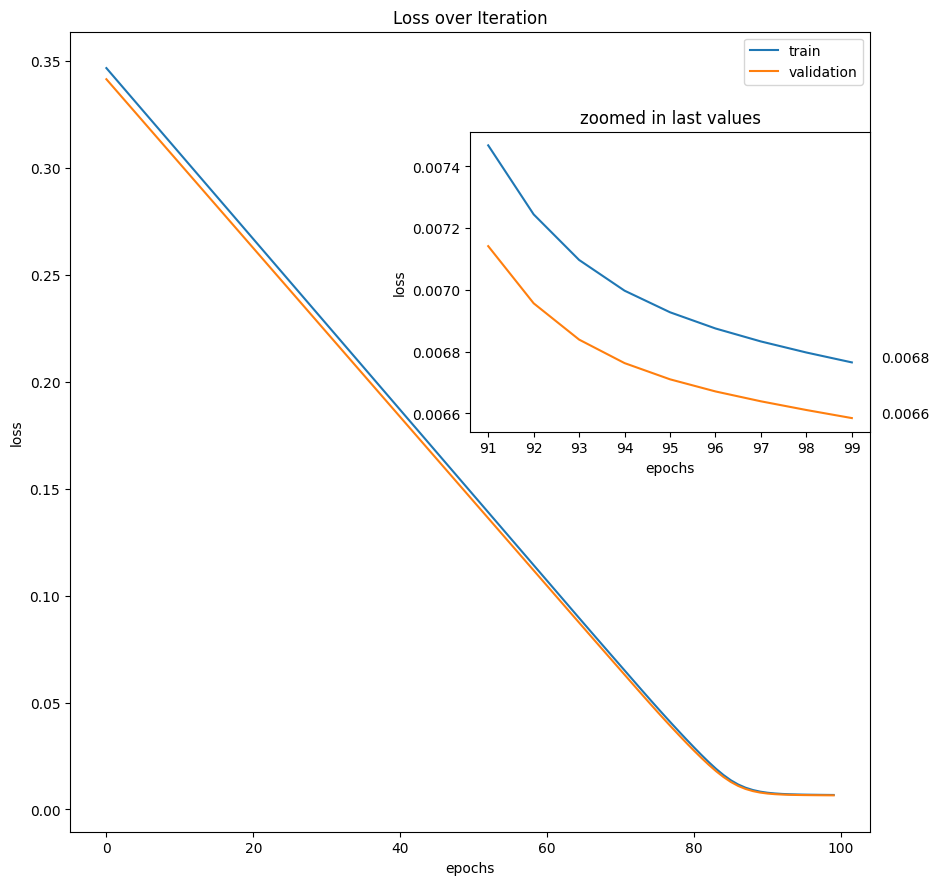

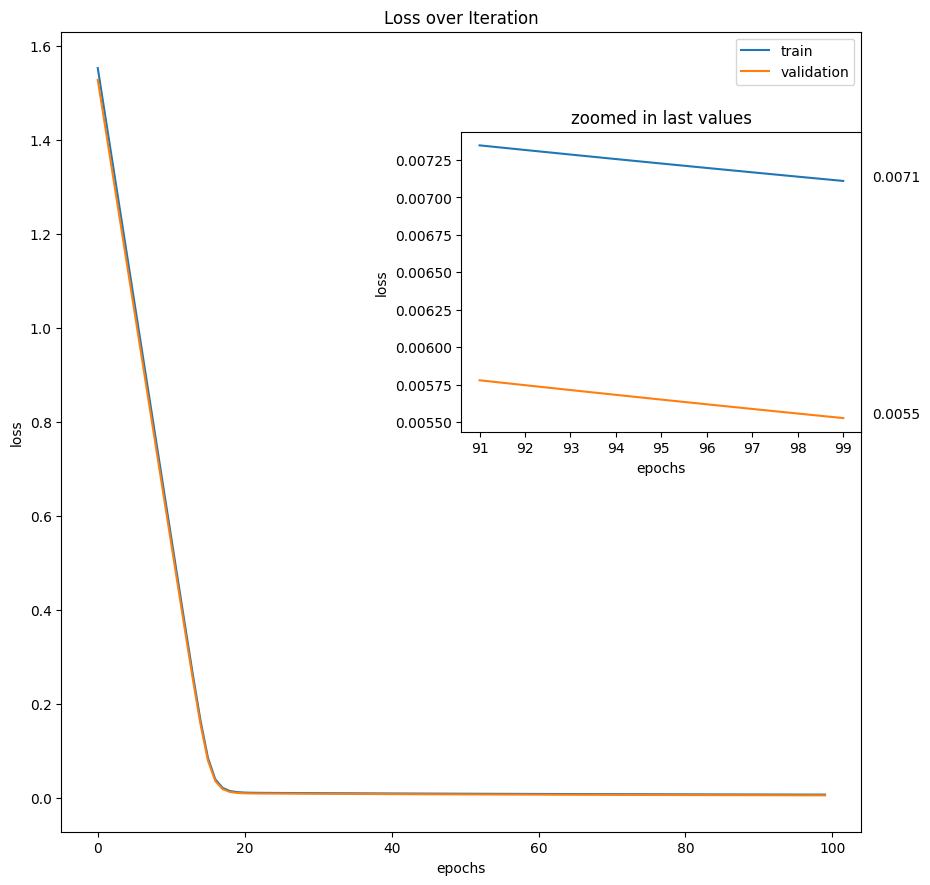

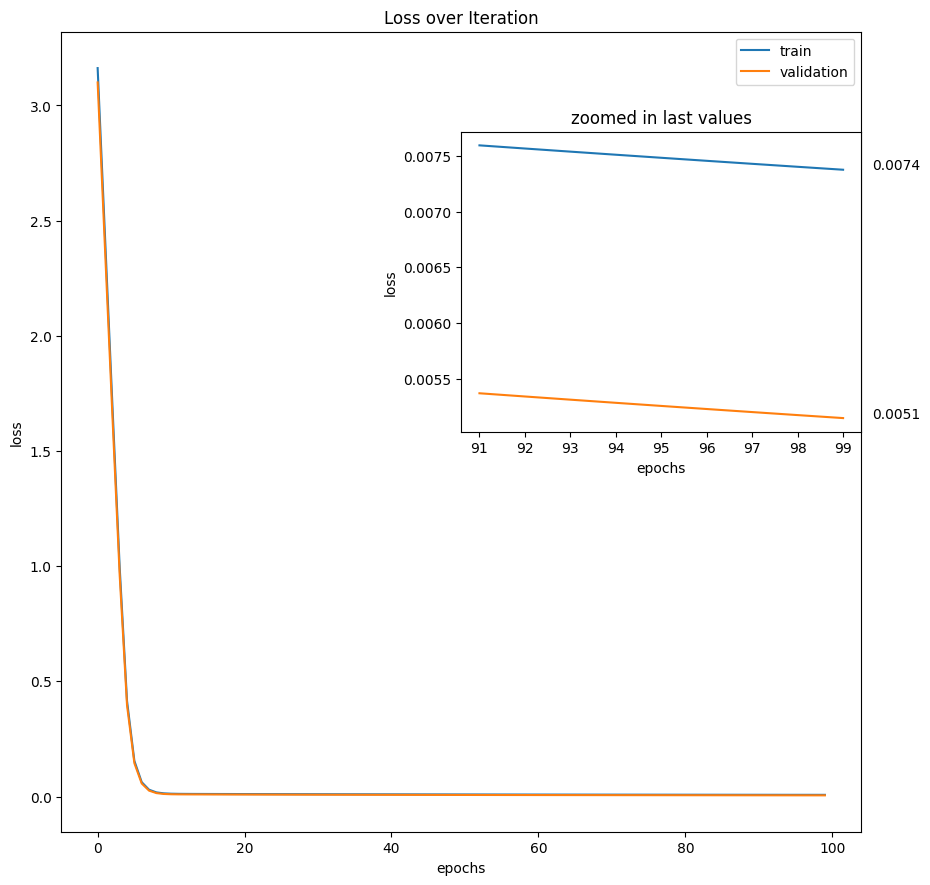

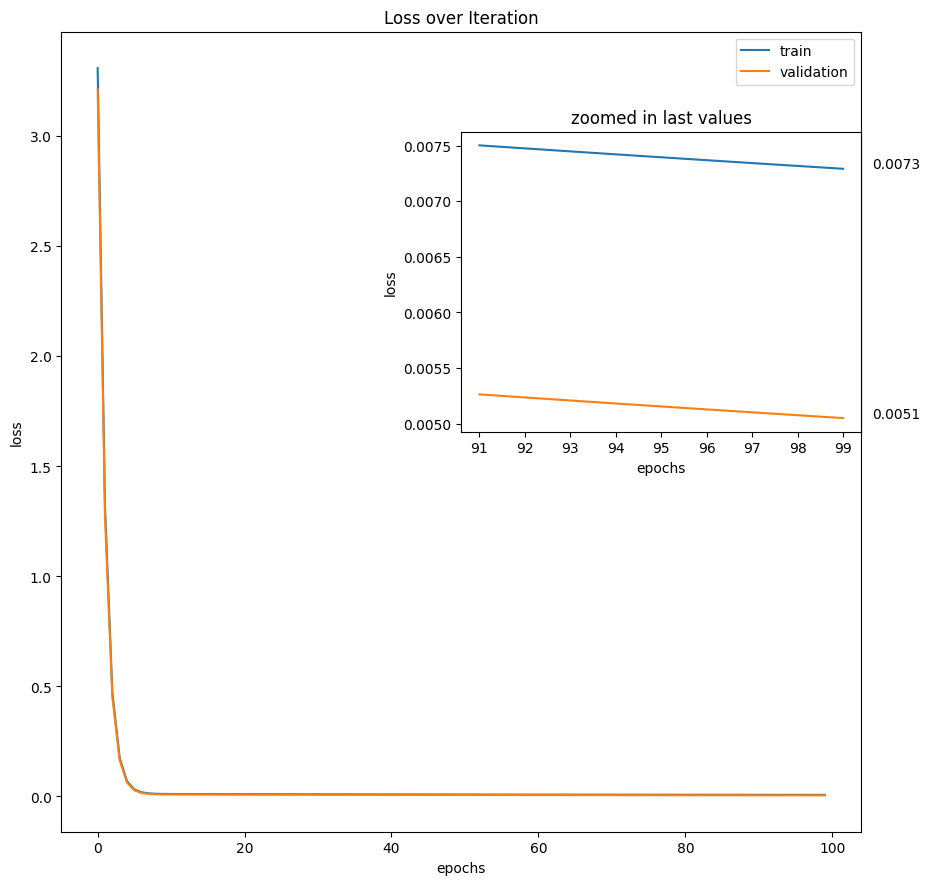

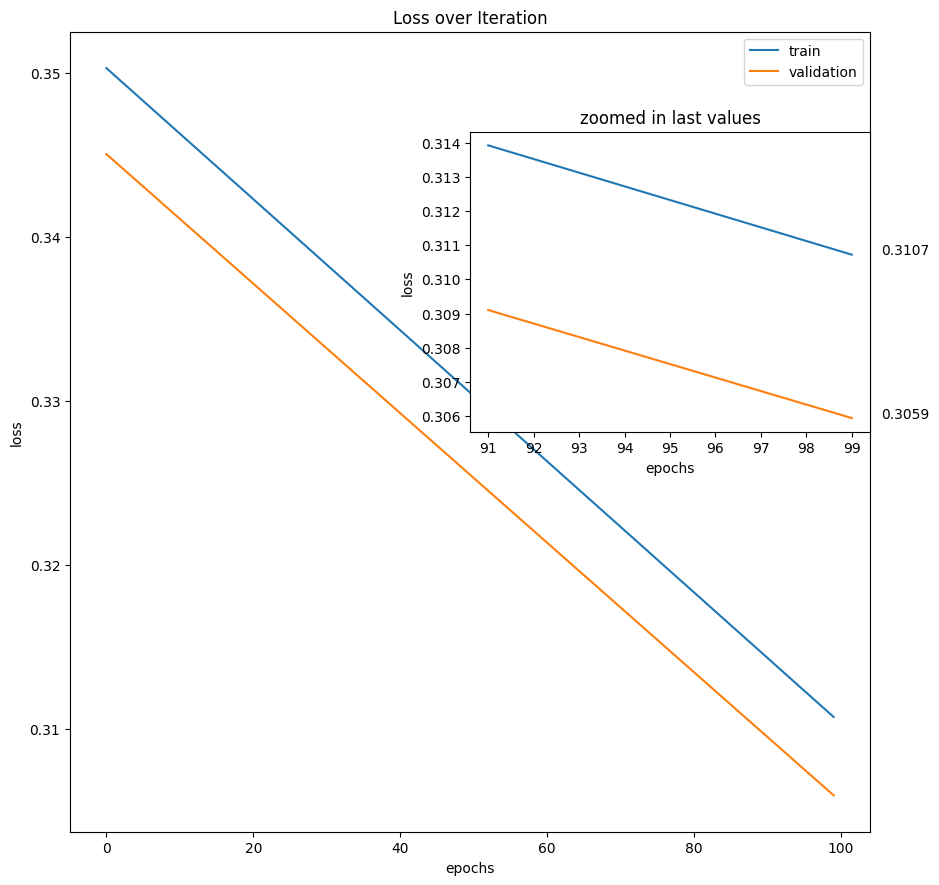

...

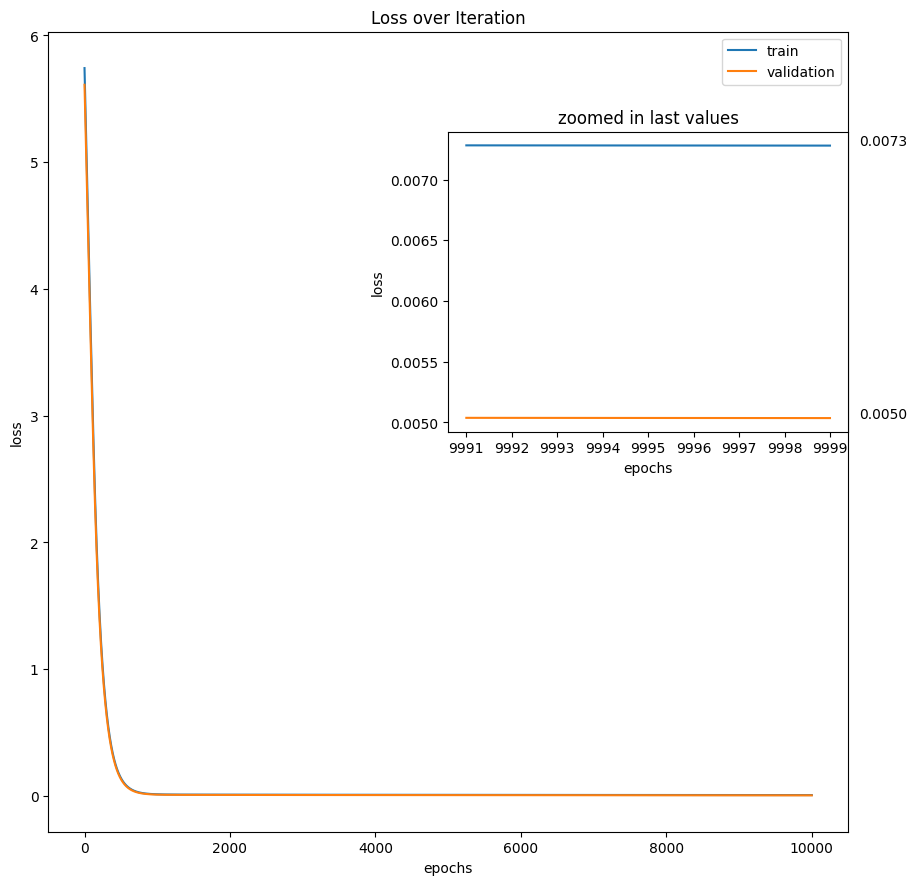

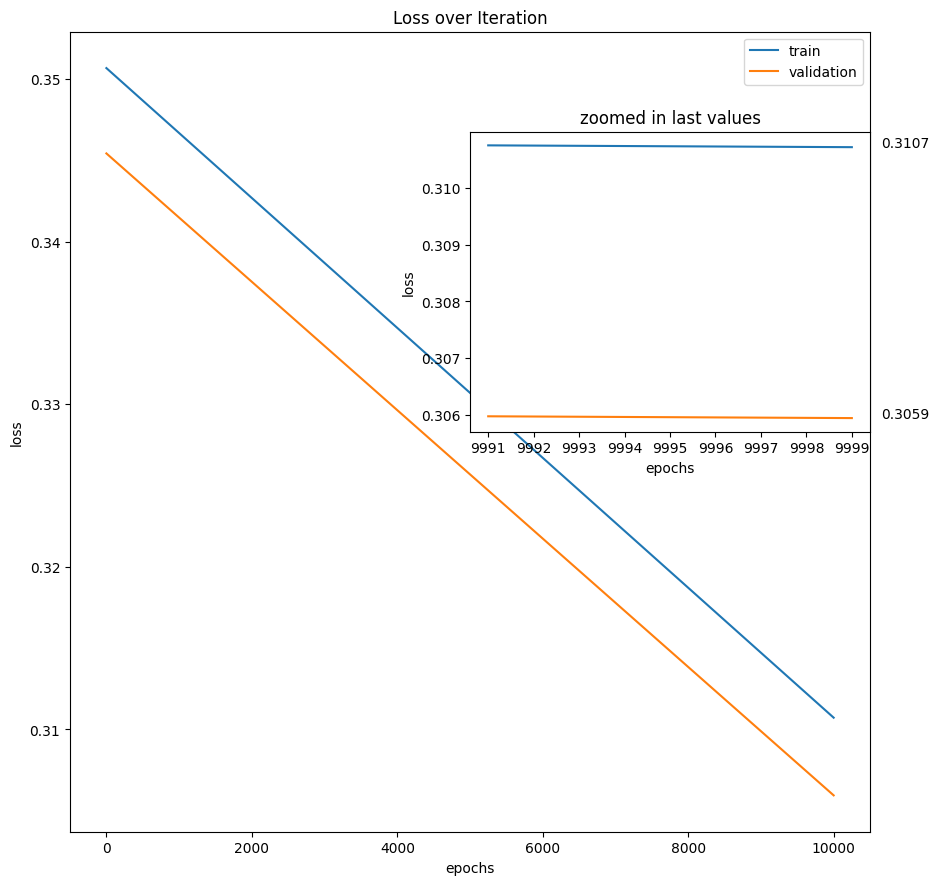

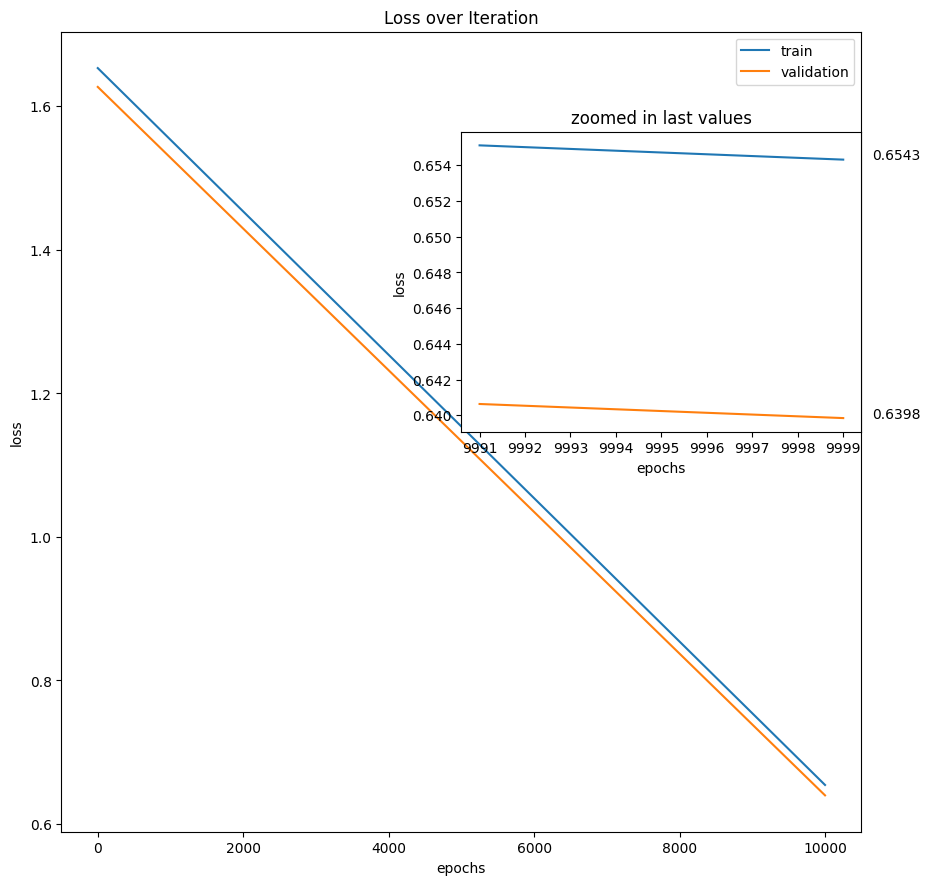

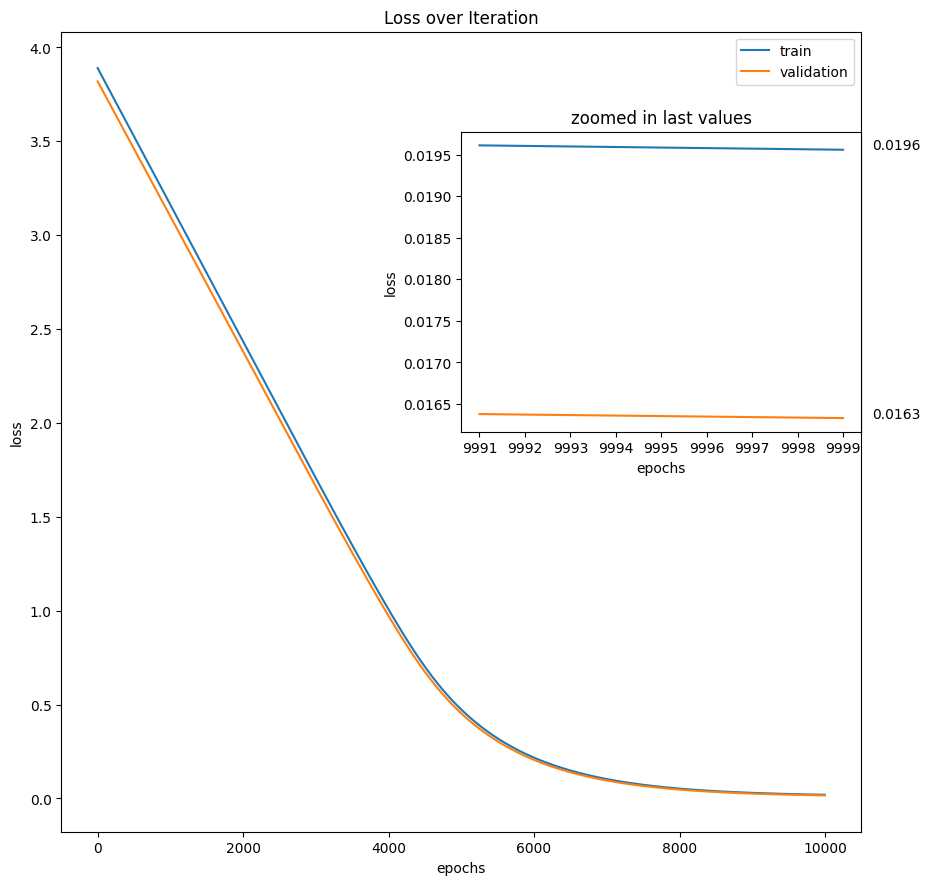

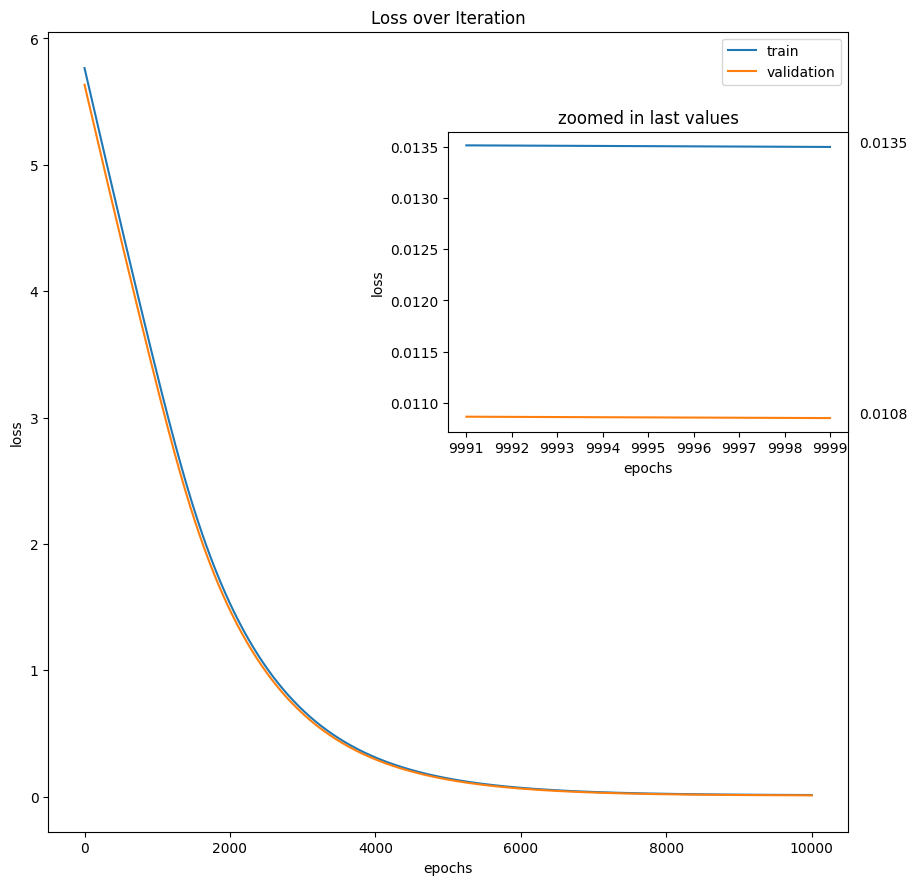

In [26]:
df = pd.DataFrame(columns=["loss","alfa","epochs","d", "loss_train", "loss_val", "loss_test", "r2_train", "r2_val", "r2_test"])
for l in ["huber"]:
  for e in [100, 1000, 5000, 10000]:
    for a in [0.1, 0.01, 0.001, 0.0001]:
      for d in [0.1, 0.5, 1.35, 2.5]:
        epochs = e 
        alfa = a 
        loss = l 
        d = d 
        
        print("---\nloss",loss,"alfa",alfa,"epochs",epochs,"d",d)

        W, loss_train, loss_val, r2_train, r2_val = train_output_print(X_train, Y_train, X_validation, Y_validation, epochs, alfa, loss, d)
        loss_test, r2_test = test_output_print(X_test, W, Y_test, loss, d)

        df = df.append({"loss":loss,"alfa":alfa,"epochs":epochs,"d":d, "loss_train":loss_train[-1], 
        "loss_val":loss_val[-1], "loss_test":loss_test, "r2_train":r2_train, "r2_val":r2_val, "r2_test":r2_test}, ignore_index=True)
df.to_csv("huber_tests.csv")
print(df.iloc[df['r2_test'].idxmax()])
df


# MSE testing


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 0.0018484944296633257
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.001848494429663325 
			last validation loss: 0.0010686555292814517
			min training loss: 0.001848494429663325
• W array:
 [0.0031659836284829114 0.01061366181912275 0.011197115114653903
 0.018069999256586644 0.0023212286281411873 -0.005147678722810122
 0.04799973527254064 -0.020999045890222282 -0.03309188192687734
 0.007750080836750173 -0.03317047755378714 0.008763701778363542
 0.03090173218863426]
• R^2 training: 0.030020231024755595
• R^2 validation: -0.041335349077937567
• test loss on current model:
 0.013986582985955539
• R^2 test: 0.0075188305576591175


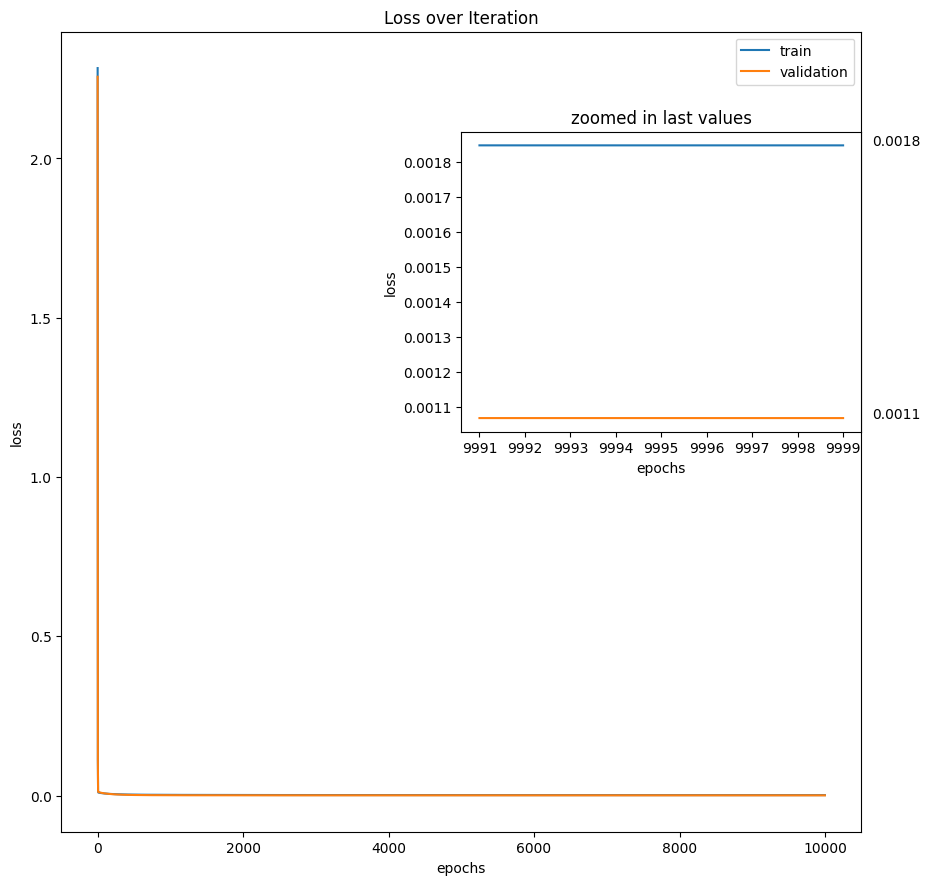

In [71]:
for e in [10000]:
  alfa = 0.1
  loss = "MSE"
  W, loss_train, loss_val, r2_train, r2_val = train_output_print(X_train, Y_train, X_validation, Y_validation, e, alfa, loss)
  test_output_print(X_test, W, Y_test, loss)


# MAE testing


[================================================= ] 99.99%  TRAINING IN PROGRESS | last computed training loss: 0.028824411806827707
Training Completed!
-------------------------------

• with epochs: 10000 -> 	last training loss: 0.028824411806827707 
			last validation loss: 0.026723569759029696
			min training loss: 0.018077986875881014
• W array:
 [0.002699297219694693 0.0024323863409576713 0.003283379776846555
 0.006945350639280543 0.005869112592032388 0.01029253606930857
 0.005540943365390515 0.0032217166277117987 -0.012170819984118715
 0.0001219867362774749 -0.006725840545438117 0.004681486386385984
 0.4188525808292698]
• R^2 training: -0.15942371543421396
• R^2 validation: -0.11151994523797071
• test loss on current model:
 0.04375040878217804
• R^2 test: 0.005645433018570789


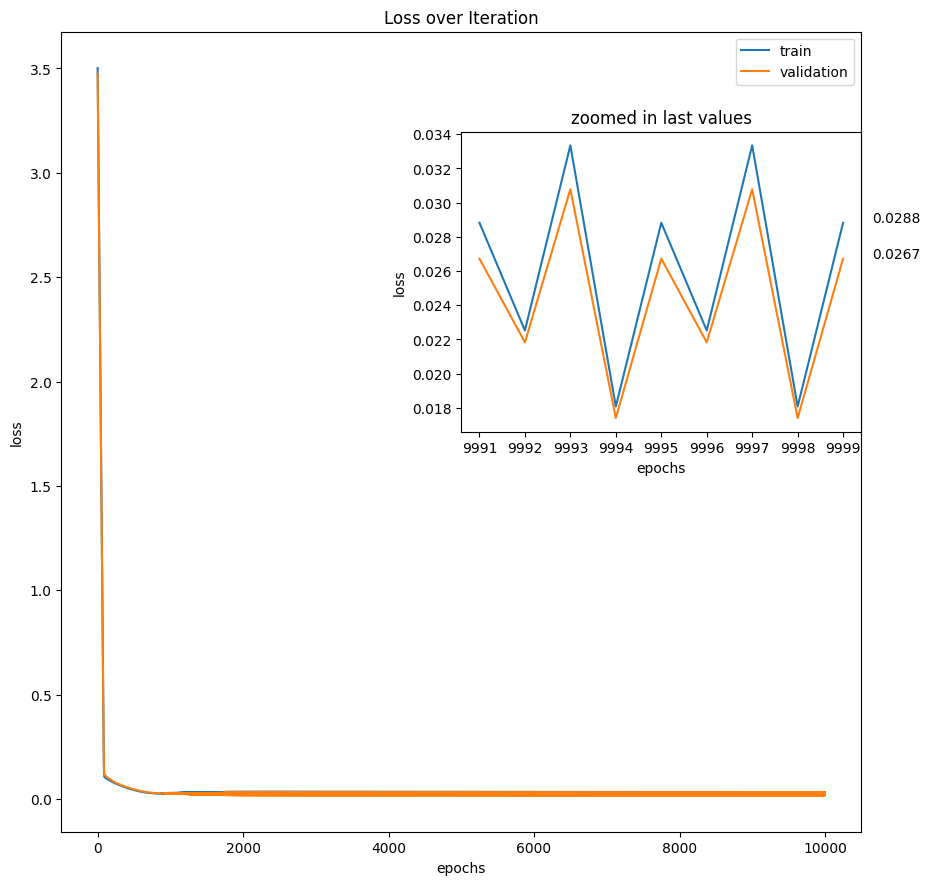

In [72]:
for e in [10000]:
  alfa = 0.01
  loss = "MAE"
  W, loss_train, loss_val, r2_train, r2_val = train_output_print(X_train, Y_train, X_validation, Y_validation, e, alfa, loss)
  test_output_print(X_test, W, Y_test, loss)

# pseudohuber testing


[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 0.6502104579049484
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.6502104579049484 
			last validation loss: 0.08219306300600443
			min training loss: 0.6502104579049484
• W array:
 [0.01349426623493925 0.010519083851451061 0.009722231942292797
 0.019679659401455607 0.0014954872729380443 -0.018684966854523637
 0.04770787824541387 -0.022148502364980727 -0.026650100670173035
 0.010162857319115846 -0.0309968867028357 0.008741988901889175
 -0.007961855899193413]
• R^2 training: 0.03173614847974093
• R^2 validation: -0.030841332434743185
• test loss on current model:
 0.8994187915871107
• R^2 test: 0.006596636105800413


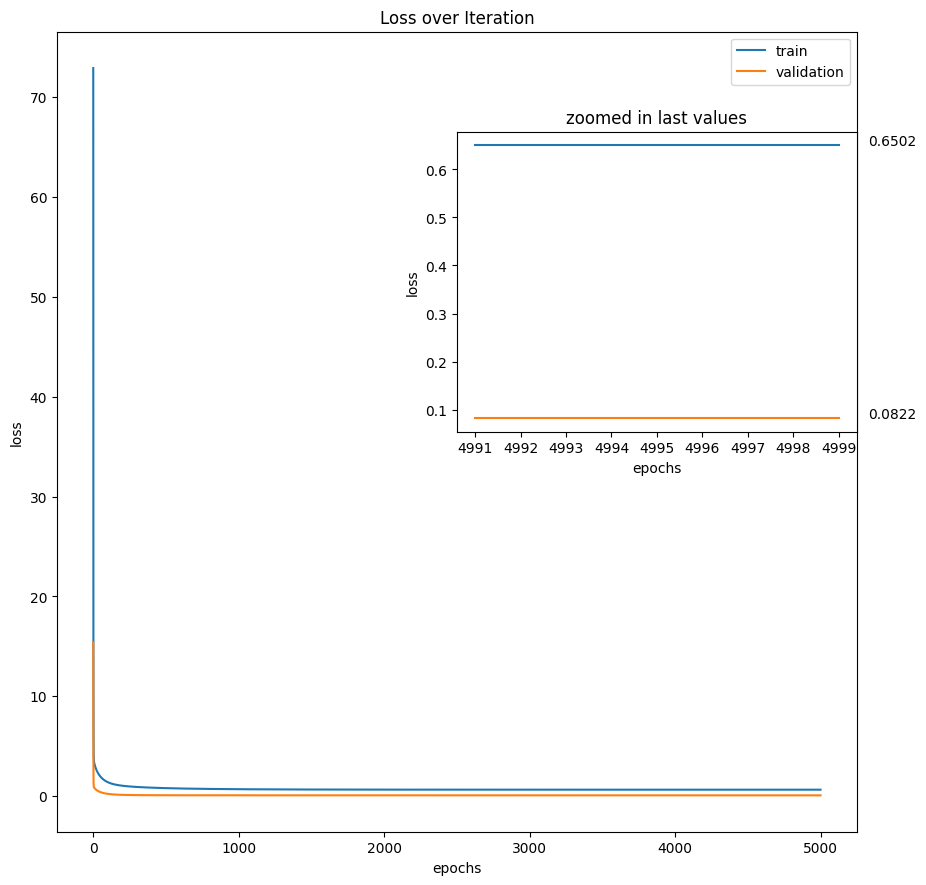

In [81]:
for e in [5000]:
  alfa = 0.001
  loss = "pseudohuber"
  d = 2.5
  W, loss_train, loss_val, r2_train, r2_val = train_output_print(X_train, Y_train, X_validation, Y_validation, e, alfa, loss, d)
  test_output_print(X_test, W, Y_test, loss)

# huber testing

[================================================= ] 99.98%  TRAINING IN PROGRESS | last computed training loss: 0.0022658012127064433
Training Completed!
-------------------------------

• with epochs: 5000 -> 	last training loss: 0.002265801212706443 
			last validation loss: 0.0006791276975368323
			min training loss: 0.002265801212706443
• W array:
 [-0.04740430023467863 0.015141517334003122 0.007990121180533341
 0.021683787467554904 0.009674086237187214 0.04356023308717458
 0.022903560125545428 -0.010857454083283528 -0.03516643495860009
 0.006136367020191668 -0.031214770795078384 0.00667946800590536
 0.17397786872536192]
• R^2 training: 0.002209946324486012
• R^2 validation: -0.04470541143618334
• test loss on current model:
 0.00014060645999508818
• R^2 test: -0.8308280826844192


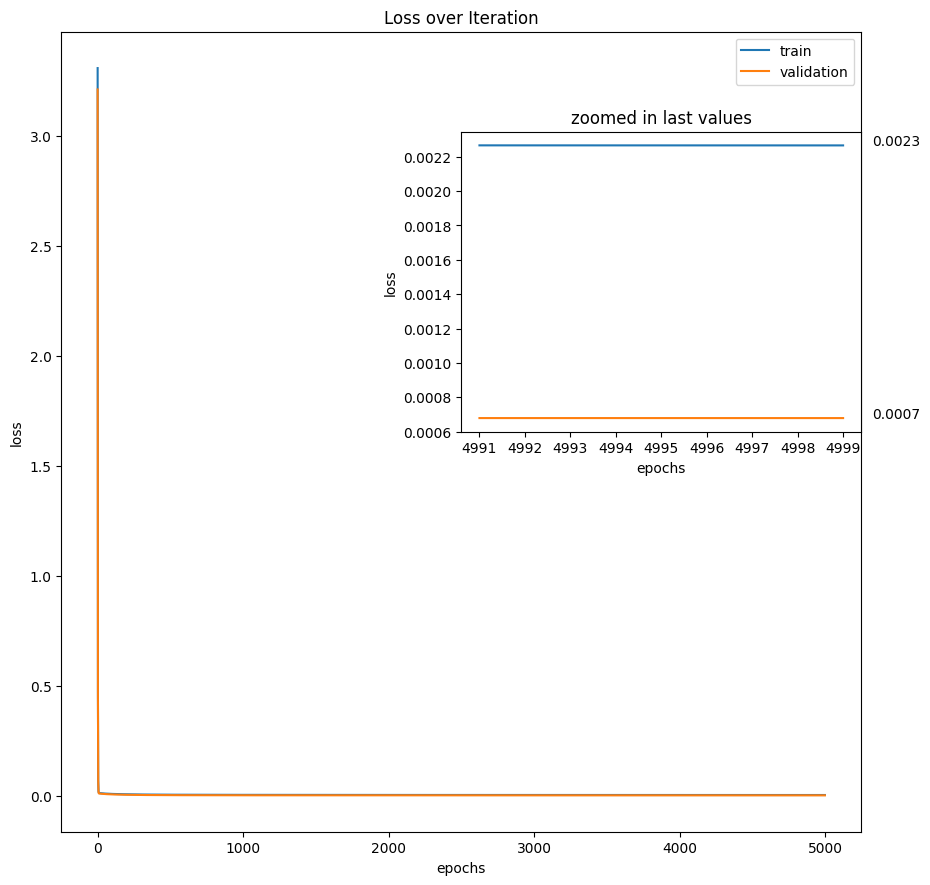

In [25]:
for e in [5000]:
  alfa = 0.1
  loss = "huber"
  d = 2.5
  W, loss_train, loss_val, r2_train, r2_val = train_output_print(X_train, Y_train, X_validation, Y_validation, e, alfa, loss, d)
  test_output_print(X_test, W, Y_test, loss)